# Synopsis:
- my first idea to simply sum up the frequencies of one eeg-band over time might not be the best approach
  -> would've come in handy for downsampling to 1 or 2 Hz which would be nice for a neural network
- instead, many use unprocessed eeg data as input for a neural network
  -> this is what I'll try next

In [14]:
%%capture
from pathlib import Path

if Path.cwd().stem == "features":
    %cd ../..
    %load_ext autoreload
    %autoreload 2

see https://canvas.ox.ac.uk/courses/214847/pages/2-dot-5-eeg-biomarkers-and-applications-of-machine-learning-aleksandra-vuckovic-12-dot-12-dot-23?module_item_id=2163271

In [15]:
import logging
from pathlib import Path

import holoviews as hv


import matplotlib.pyplot as plt
import mne
import plotly.io as pio
from polars import col
import pywt
import numpy as np
from scipy import signal

import pandas as pd
import bottleneck as bn
import polars as pl

import matplotlib.pyplot as plt
from scipy.signal import spectrogram
import hvplot.polars  # noqa

from src.features.transforming import merge_dfs
from icecream import ic
from src.data.database_manager import DatabaseManager
from src.experiments.measurement.stimulus_generator import StimulusGenerator
from src.data.quality_checks import check_sample_rate
from src.features.scaling import scale_min_max
from src.features.filtering import filter_butterworth
from src.features.transforming import map_trials
from src.features.resampling import add_time_column, downsample
from src.log_config import configure_logging
from src.plots.utils import prepare_multiline_hvplot
from src.features.resampling import decimate
from src.plots.plot_modality import plot_modality_over_trials


configure_logging(
    stream_level=logging.DEBUG,
    ignore_libs=["matplotlib", "Comm", "bokeh", "tornado"],
)

pl.Config.set_tbl_rows(12)  # for the 12 trials
hv.output(widget_location="bottom", size=130)

In [16]:
db = DatabaseManager()

In [17]:
with db:
    eeg = db.get_table("Preprocess_EEG")
    trials = db.get_table("Trials")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

(shape: (29_882_180, 13)
 ┌──────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬───────────┐
 │ trial_id ┆ trial_num ┆ participa ┆ rownumber ┆ … ┆ ch5       ┆ ch6       ┆ ch7       ┆ ch8       │
 │ ---      ┆ ber       ┆ nt_id     ┆ ---       ┆   ┆ ---       ┆ ---       ┆ ---       ┆ ---       │
 │ u16      ┆ ---       ┆ ---       ┆ u32       ┆   ┆ f64       ┆ f64       ┆ f64       ┆ f64       │
 │          ┆ u8        ┆ u8        ┆           ┆   ┆           ┆           ┆           ┆           │
 ╞══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪═══════════╡
 │ 1        ┆ 1         ┆ 1         ┆ 147086    ┆ … ┆ -1.786814 ┆ 3.855764  ┆ 1.39288   ┆ 2.75779   │
 │ 1        ┆ 1         ┆ 1         ┆ 147087    ┆ … ┆ 0.946589  ┆ 0.827812  ┆ -2.377541 ┆ 0.048265  │
 │ 1        ┆ 1         ┆ 1         ┆ 147088    ┆ … ┆ 3.382162  ┆ -2.009743 ┆ -5.883247 ┆ -2.499304 │
 │ 1        ┆ 1         ┆ 1         ┆ 147089    ┆ … ┆ 5.3

In [21]:
df = merge_dfs(
    dfs=[eeg, trials], on=["trial_id", "participant_id", "trial_number"]
).drop("timestamp_start", "timestamp_end", "duration")
df

trial_id,trial_number,participant_id,rownumber,timestamp,ch1,ch2,ch3,ch4,ch5,ch6,ch7,ch8,stimulus_seed,skin_area
u16,u8,u8,u32,f64,f64,f64,f64,f64,f64,f64,f64,f64,u16,u8
1,1,1,147086,294198.4628,-4.307507,-3.633791,5.202741,1.923693,-1.786814,3.855764,1.39288,2.75779,396,1
1,1,1,147087,294200.3867,2.147077,2.253413,1.356275,-0.458836,0.946589,0.827812,-2.377541,0.048265,396,1
1,1,1,147088,294202.5715,8.040627,7.616097,-2.185388,-2.686442,3.382162,-2.009743,-5.883247,-2.499304,396,1
1,1,1,147089,294204.4057,12.909388,12.032986,-5.126694,-4.588218,5.30146,-4.458884,-8.861123,-4.713696,396,1
1,1,1,147090,294206.6215,16.464461,15.261681,-7.216366,-5.982968,6.61533,-6.331784,-11.066826,-6.4232,396,1
1,1,1,147091,294208.5568,18.640287,17.279803,-8.278423,-6.696603,7.384224,-7.472635,-12.300784,-7.474192,396,1
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
332,12,28,1388508,2.7771e6,5.613294,3.919896,1.433396,5.761945,5.941539,0.178497,4.650987,-3.104973,133,1
332,12,28,1388509,2.7771e6,5.263183,3.306886,1.184009,4.740774,4.760153,-0.031284,3.955327,-2.837235,133,1


In [22]:
df.hvplot(
    x="timestamp",
    y=["ch1", "ch2", "ch3", "ch4", "ch5", "ch6", "ch7", "ch8"],
    groupby="trial_id",
    width=800,
    height=400,
)

BokehModel(combine_events=True, render_bundle={'docs_json': {'18860542-1f3d-4e1d-93aa-63c8f18381c7': {'version…

(0.0, 50.0)

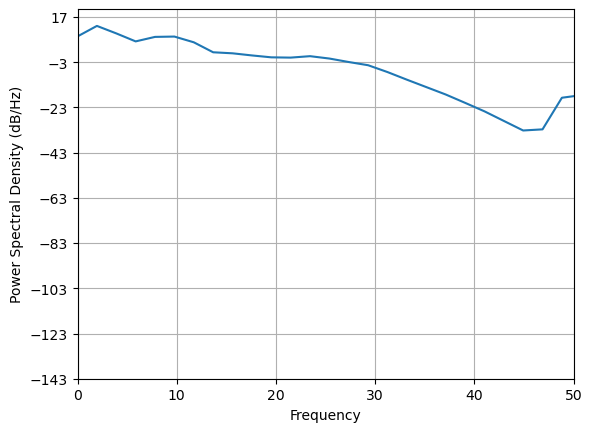

In [38]:
####################################################################################################
# TODO: Filter using MNE, KEEP IT SIMPLE STUPID
####################################################################################################

trial_id = 10
trial = df.filter(col("trial_id") == trial_id)
plt.psd(trial["ch1"], Fs=500)
plt.xlim(0, 50)

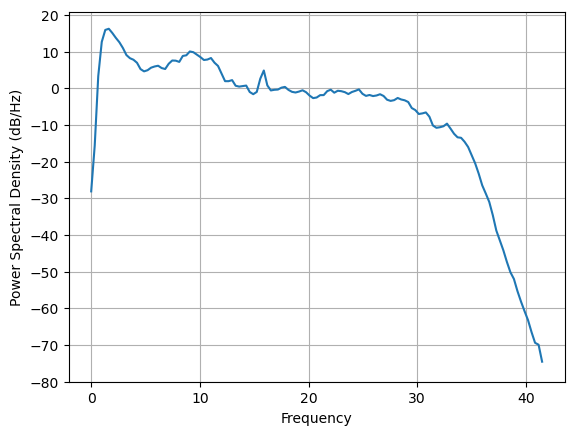

In [29]:
trial_decimated = decimate(trial, 6)
plt.psd(trial_decimated["ch1"], Fs=83);

In [9]:
seed = df.filter(col("stimulus_seed") == 396)
seed["trial_id"].unique().to_numpy()

array([  1,  24,  29,  44,  53,  60,  80,  82,  96, 112, 123, 136, 149,
       163, 168, 188, 197, 207, 224, 232, 247, 258, 268, 277, 295, 299,
       315, 321], dtype=uint16)

(15, 401)

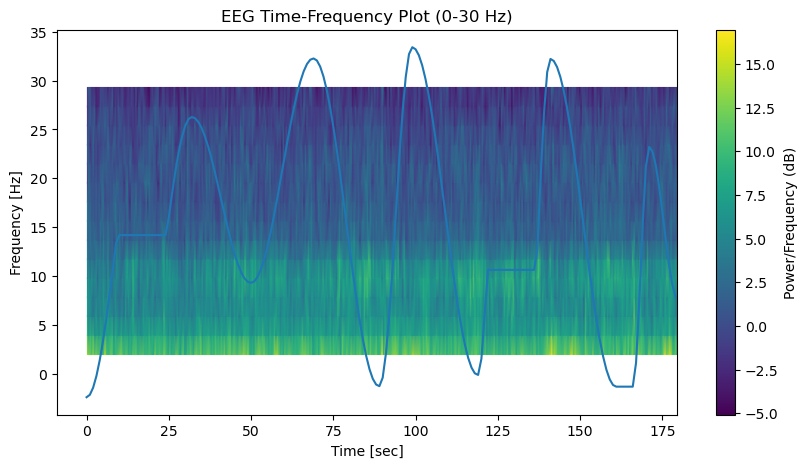

In [10]:
sampling_rate = 500  # Replace with your EEG's sampling rate in Hz
low_freq = 1
high_freq = 30
spectrogram_data_all = np.zeros((15, 401))


for trial in seed["trial_id"].unique().to_numpy():
    eeg_ch = df.filter(col("trial_id") == trial)["ch5"].to_numpy()
    frequencies, times, spectrogram_data = spectrogram(eeg_ch, fs=sampling_rate)
    freq_indices = (frequencies >= low_freq) & (frequencies <= high_freq)
    frequencies = frequencies[freq_indices]
    spectrogram_data_all += spectrogram_data[freq_indices, :]


spectrogram_data_all /= seed["trial_id"].n_unique()

plt.figure(figsize=(10, 5))
plt.pcolormesh(
    times, frequencies, 10 * np.log10(spectrogram_data_all), shading="gouraud"
)
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")
plt.title("EEG Time-Frequency Plot (0-30 Hz)")
plt.colorbar(label="Power/Frequency (dB)")

stim = StimulusGenerator(seed=396)
stim.y
# z standardization of stim.y
stim.y = (stim.y - stim.y.mean()) / stim.y.std()
plt.plot(stim.y[::10] * 10 + 15)


spectrogram_data_all.shape

In [11]:
trial = df.filter(col("trial_id") == 100)

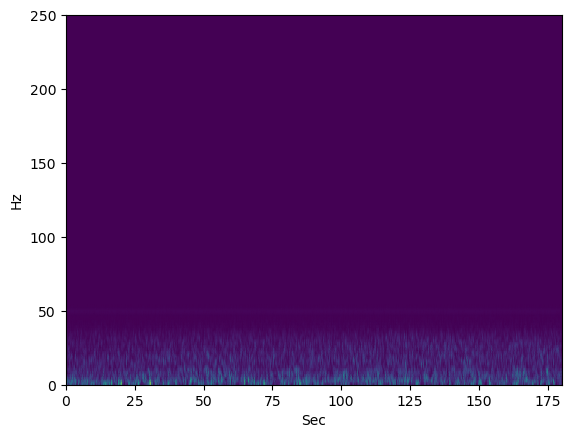

In [12]:
import numpy as np
from scipy.signal import stft
import matplotlib.pyplot as plt

fs = 500

f, t, Zxx = stft(trial["ch5"], fs=fs)

plt.pcolormesh(t, f, np.abs(Zxx), shading="gouraud")
plt.ylabel("Hz")
plt.xlabel("Sec")
plt.show()

In [13]:
from scipy.signal.windows import hamming

window = hamming(1000)  # in seconds
hop = 10  # in seconds
fs = 500  # in Hz
SFT = ShortTimeFFT(win=window, hop=hop, fs=fs)
sft_data = SFT.stft(trial["ch5"].to_numpy())

NameError: name 'ShortTimeFFT' is not defined

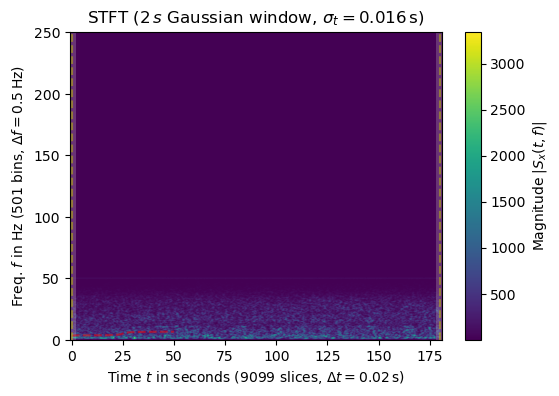

In [104]:
N = 500 * 180  # number of samples to plot
fig1, ax1 = plt.subplots(figsize=(6.0, 4.0))  # enlarge plot a bit
t_lo, t_hi = SFT.extent(500 * 180)[:2]  # time range of plot
ax1.set_title(
    rf"STFT ({SFT.m_num*SFT.T:g}$\,s$ Gaussian window, "
    + rf"$\sigma_t={g_std*SFT.T}\,$s)"
)
ax1.set(
    xlabel=f"Time $t$ in seconds ({SFT.p_num(N)} slices, "
    + rf"$\Delta t = {SFT.delta_t:g}\,$s)",
    ylabel=f"Freq. $f$ in Hz ({SFT.f_pts} bins, "
    + rf"$\Delta f = {SFT.delta_f:g}\,$Hz)",
    xlim=(t_lo, t_hi),
)
im1 = ax1.imshow(
    abs(sft_data), origin="lower", aspect="auto", extent=SFT.extent(N), cmap="viridis"
)
ax1.plot(t_x, f_i, "r--", alpha=0.5, label="$f_i(t)$")
fig1.colorbar(im1, label="Magnitude $|S_x(t, f)|$")
# Shade areas where window slices stick out to the side:
for t0_, t1_ in [
    (t_lo, SFT.lower_border_end[0] * SFT.T),
    (SFT.upper_border_begin(N)[0] * SFT.T, t_hi),
]:
    ax1.axvspan(t0_, t1_, color="w", linewidth=0, alpha=0.2)
for t_ in [0, N * SFT.T]:  # mark signal borders with vertical line:
    ax1.axvline(t_, color="y", linestyle="--", alpha=0.5)

plt.show()

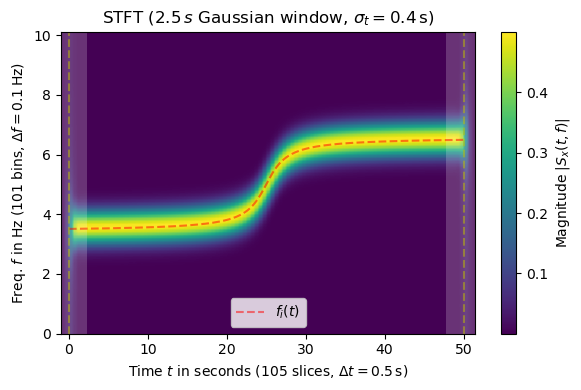

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import ShortTimeFFT
from scipy.signal.windows import gaussian

T_x, N = 1 / 20, 1000  # 20 Hz sampling rate for 50 s signal
t_x = np.arange(N) * T_x  # time indexes for signal
f_i = 1 * np.arctan((t_x - t_x[N // 2]) / 2) + 5  # varying frequency
x = np.sin(2 * np.pi * np.cumsum(f_i) * T_x)  # the signal
g_std = 8  # standard deviation for Gaussian window in samples
w = gaussian(50, std=g_std, sym=True)  # symmetric Gaussian window
SFT = ShortTimeFFT(w, hop=10, fs=1 / T_x, mfft=200, scale_to="magnitude")
Sx = SFT.stft(x)  # perform the STFT
fig1, ax1 = plt.subplots(figsize=(6.0, 4.0))  # enlarge plot a bit
t_lo, t_hi = SFT.extent(N)[:2]  # time range of plot
ax1.set_title(
    rf"STFT ({SFT.m_num*SFT.T:g}$\,s$ Gaussian window, "
    + rf"$\sigma_t={g_std*SFT.T}\,$s)"
)
ax1.set(
    xlabel=f"Time $t$ in seconds ({SFT.p_num(N)} slices, "
    + rf"$\Delta t = {SFT.delta_t:g}\,$s)",
    ylabel=f"Freq. $f$ in Hz ({SFT.f_pts} bins, "
    + rf"$\Delta f = {SFT.delta_f:g}\,$Hz)",
    xlim=(t_lo, t_hi),
)
im1 = ax1.imshow(
    abs(Sx), origin="lower", aspect="auto", extent=SFT.extent(N), cmap="viridis"
)
ax1.plot(t_x, f_i, "r--", alpha=0.5, label="$f_i(t)$")
fig1.colorbar(im1, label="Magnitude $|S_x(t, f)|$")
# Shade areas where window slices stick out to the side:
for t0_, t1_ in [
    (t_lo, SFT.lower_border_end[0] * SFT.T),
    (SFT.upper_border_begin(N)[0] * SFT.T, t_hi),
]:
    ax1.axvspan(t0_, t1_, color="w", linewidth=0, alpha=0.2)
for t_ in [0, N * SFT.T]:  # mark signal borders with vertical line:
    ax1.axvline(t_, color="y", linestyle="--", alpha=0.5)
ax1.legend()
fig1.tight_layout()
plt.show()

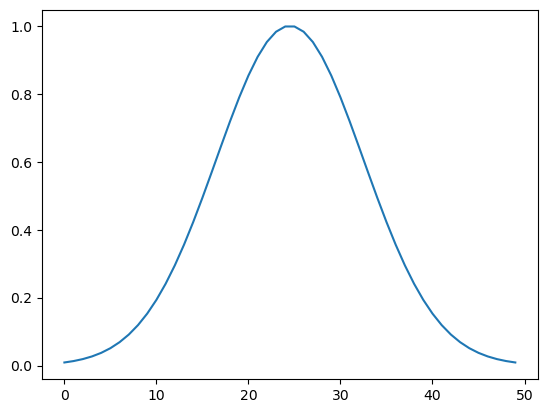

In [39]:
plt.plot(w)

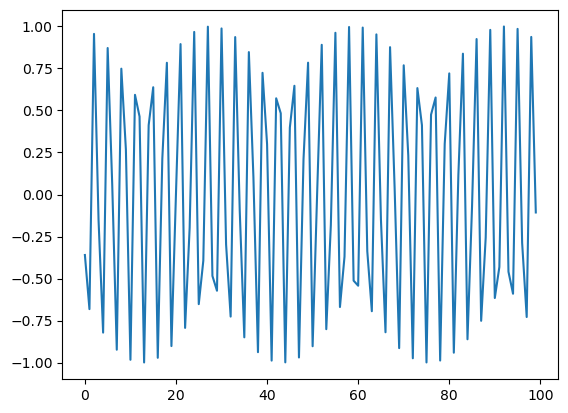

In [36]:
plt.plot(x[800:900])

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import ShortTimeFFT
from scipy.signal.windows import hann

# Parameters
sampling_rate = 500  # Hz
low_freq = 1
high_freq = 30
n_trials = len(seed["trial_id"].unique())

# Create ShortTimeFFT object
window_length = int(0.2 * sampling_rate)  # 200 ms window
hop_length = int(0.01 * sampling_rate)  # 10 ms hop
window = hann(window_length)
stft = ShortTimeFFT(
    window, hop_length, sampling_rate, fft_mode="onesided", scale_to="psd"
)

# Initialize array to store averaged spectrogram
spectrogram_data_all = None

for trial in seed["trial_id"].unique().to_numpy():
    eeg_ch = df.filter(col("trial_id") == trial)["ch5"].to_numpy()

    # Compute STFT
    S = stft.stft(eeg_ch)

    # Extract relevant frequency range
    freq_indices = (stft.f >= low_freq) & (stft.f <= high_freq)
    S = S[freq_indices, :]

    if spectrogram_data_all is None:
        spectrogram_data_all = np.zeros_like(S, dtype=float)

    spectrogram_data_all += np.abs(S) ** 2  # Power spectral density

# Average across trials
spectrogram_data_all /= n_trials

# Plot
plt.figure(figsize=(10, 5))
plt.pcolormesh(
    stft.t(len(eeg_ch)),
    stft.f[freq_indices],
    10 * np.log10(spectrogram_data_all),
    shading="gouraud",
)
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")
plt.title("EEG Time-Frequency Plot (1-30 Hz)")
plt.colorbar(label="Power/Frequency (dB)")

# Add stimulus plot
stim = StimulusGenerator(seed=396)
stim.y = (stim.y - stim.y.mean()) / stim.y.std()
plt.plot(stft.t(len(eeg_ch)), stim.y[::10] * 10 + 15)

plt.show()

print(spectrogram_data_all.shape)


ValueError: operands could not be broadcast together with shapes (6,18020) (6,18021) (6,18020) 

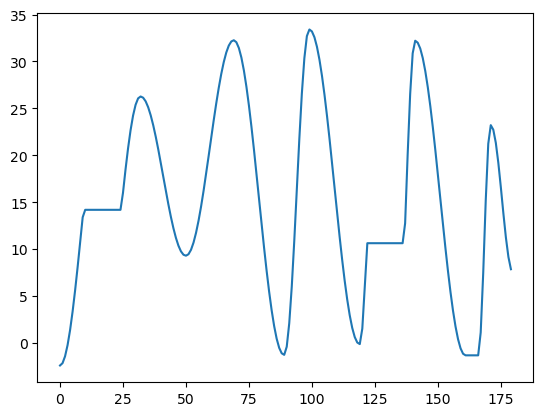

In [126]:
from src.experiments.measurement.stimulus_generator import StimulusGenerator

stim = StimulusGenerator(seed=396)
stim.y
# z standardization of stim.y
stim.y = (stim.y - stim.y.mean()) / stim.y.std()
plt.plot(stim.y[::10] * 10 + 15)


(15, 401)

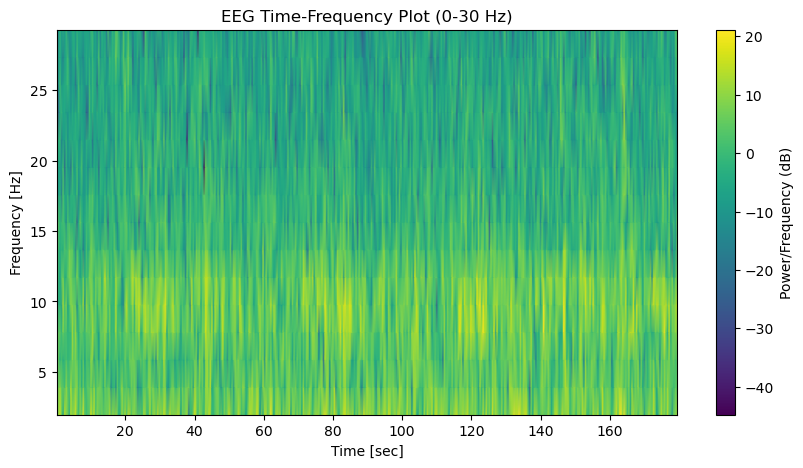

In [67]:
eeg_ch = df.filter(col("trial_id") == 6)["ch5"].to_numpy()


sampling_rate = 500  # Replace with your EEG's sampling rate in Hz
low_freq = 1
high_freq = 30


# Computing the spectrogram
frequencies, times, spectrogram_data = spectrogram(eeg_ch, fs=sampling_rate)

# Limiting the spectrogram to the frequency range of interest
freq_indices = (frequencies >= low_freq) & (frequencies <= high_freq)
frequencies = frequencies[freq_indices]
spectrogram_data_all = spectrogram_data[freq_indices, :]


plt.figure(figsize=(10, 5))
plt.pcolormesh(
    times, frequencies, 10 * np.log10(spectrogram_data_all), shading="gouraud"
)
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")
plt.title("EEG Time-Frequency Plot (0-30 Hz)")
plt.colorbar(label="Power/Frequency (dB)")
spectrogram_data_all.shape

In [55]:
import numpy as np

empty_array = np.empty((15, 410))
empty_array += np.random.rand(15, 410)
empty_array += np.random.rand(15, 410)
empty_array += np.random.rand(15, 410)


In [72]:
import scipy.fftpack as fftpack
import matplotlib as mpl

In [73]:
sample_rate = 500
eeg_data = df.select(
    ["ch1", "ch2", "ch3", "ch4", "ch5", "ch6", "ch7", "ch8"]
).to_numpy()
eeg_data.shape


(90011, 8)

In [74]:
data = eeg_data[:, 5]

In [75]:
N = int(sample_rate / 2.0)
f = fftpack.fftfreq(N, 1.0 / sample_rate)
t = np.linspace(0, 0.5, N)
mask = (f > 3) * (f < 40)

In [76]:
subdata = data[:N]
F = fftpack.fft(subdata)

Text(0.5, 0, 'Frequency (Hz)')

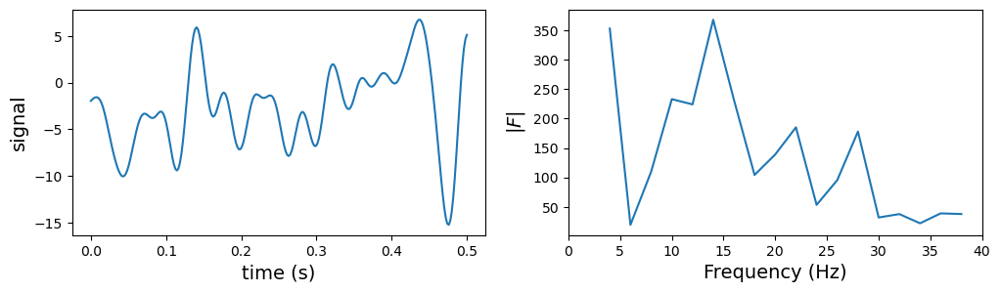

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 3))
axes[0].plot(t, subdata)
axes[0].set_ylabel("signal", fontsize=14)
axes[0].set_xlabel("time (s)", fontsize=14)
axes[1].plot(f[mask], abs(F[mask]))
axes[1].set_xlim(0, 40)
axes[1].set_ylabel("$|F|$", fontsize=14)
axes[1].set_xlabel("Frequency (Hz)", fontsize=14)

In [78]:
n_max = int(data.shape[0] / N)
f_values = np.sum(1 * mask)
spectogram_data = np.zeros((n_max, f_values))

In [79]:
window = signal.windows.blackman(len(subdata))

for n in range(0, n_max):
    subdata = data[(N * n) : (N * (n + 1))]
    F = fftpack.fft(subdata * window)
    spectogram_data[n, :] = np.log(abs(F[mask]))

<>:7: SyntaxWarning: invalid escape sequence '\l'
<>:7: SyntaxWarning: invalid escape sequence '\l'
/var/folders/54/0yy_ylvj7tx247wkq0n07dnr0000gn/T/ipykernel_29453/2338042718.py:7: SyntaxWarning: invalid escape sequence '\l'
  cb.set_label("$\log|F|$", fontsize=14)


Text(0.5, 0, 'Frequency (Hz)')

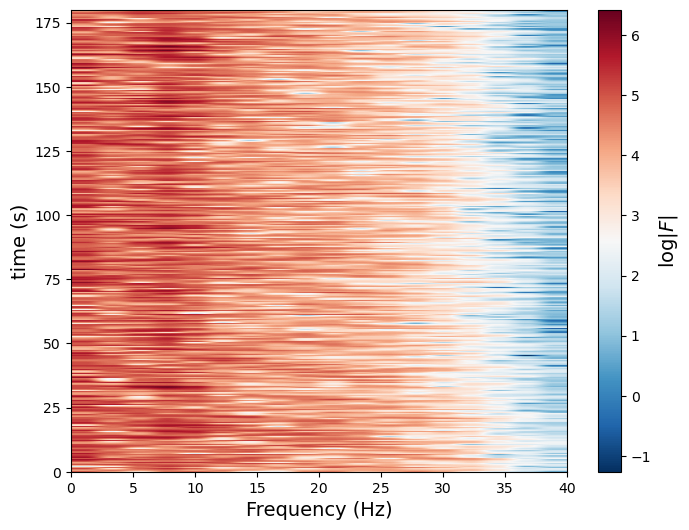

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
p = ax.imshow(
    spectogram_data,
    origin="lower",
    extent=(0, 40, 0, data.shape[0] / sample_rate),
    aspect="auto",
    cmap=mpl.cm.RdBu_r,
)
cb = fig.colorbar(p, ax=ax)
cb.set_label("$\log|F|$", fontsize=14)
ax.set_ylabel("time (s)", fontsize=14)
ax.set_xlabel("Frequency (Hz)", fontsize=14)

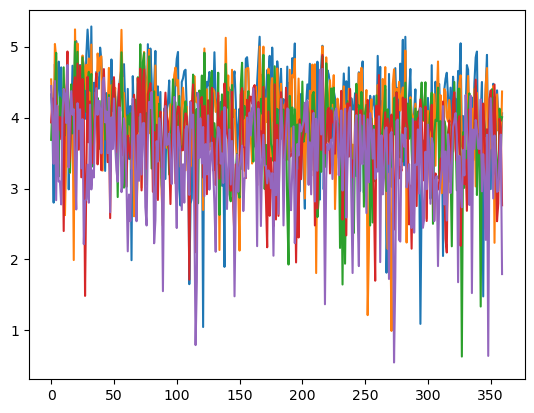

In [104]:
spectogram_data.shape
plt.plot(spectogram_data[:, 8])
plt.plot(spectogram_data[:, 9])
plt.plot(spectogram_data[:, 10])
plt.plot(spectogram_data[:, 11])
plt.plot(spectogram_data[:, 12])

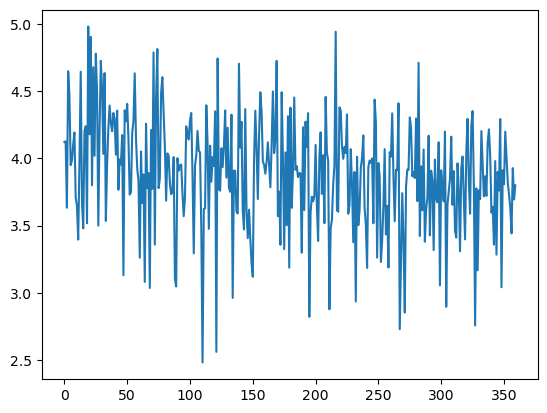

In [109]:
m = np.mean(spectogram_data[:, 8:12], axis=1)
plt.plot(m)

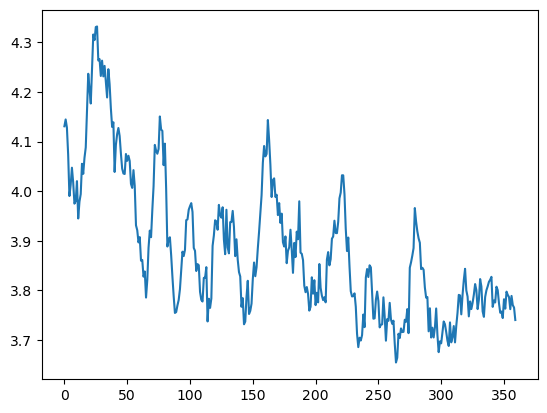

In [117]:
from scipy.ndimage import uniform_filter1d

y_smooth = uniform_filter1d(m, size=15)
plt.plot(y_smooth)

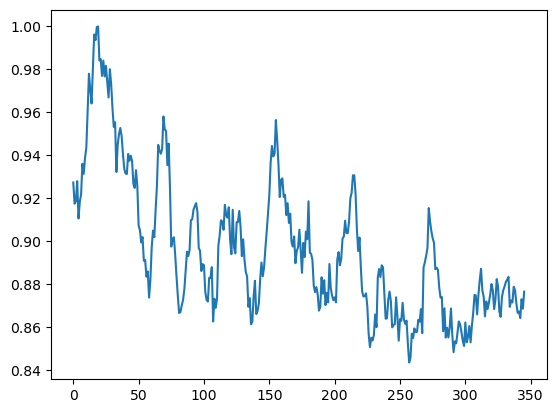

In [138]:
def smoothen(x, winsize=5):
    return np.array(pd.Series(x).rolling(winsize).mean())[winsize - 1 :]


smooth = smoothen(m, 15) / np.max(smoothen(m, 15))
plt.plot(smooth)

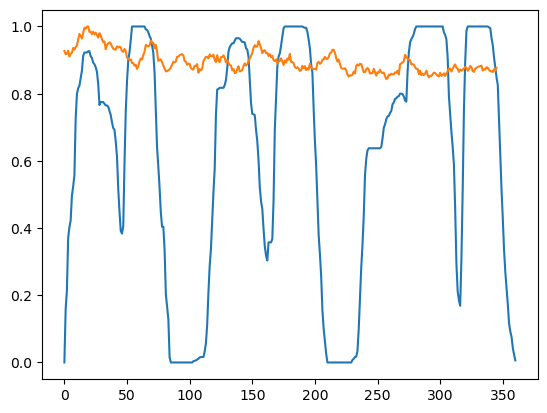

In [140]:
with db:
    df = db.get_table("Feature_Stimulus")

df = df.filter(col("trial_id") == trial)
rating = df.select("rating").to_numpy()[::5]
plt.plot(rating)
plt.plot(smooth.reshape(-1, 1))

In [94]:
spectogram_data[0]

array([4.89273081, 4.19898198, 3.13614934, 4.61672719, 4.73186901,
       4.27458274, 2.59853324, 2.47841329, 4.32797477, 4.53735436,
       3.68580108, 3.93227273, 4.44446537, 3.96552212, 2.85645949,
       2.13540615, 1.60753601, 0.69719481])

In [87]:
spectogram_data.shape

(360, 18)

In [21]:
signal

<module 'scipy.signal' from '/Users/visser/miniforge3/envs/pain/lib/python3.12/site-packages/scipy/signal/__init__.py'>

In [69]:
plot_modality_over_trials("stimulus", specific_trial=222)

BokehModel(combine_events=True, render_bundle={'docs_json': {'6bcbbefb-0470-4643-99ed-3aabcd8b2d53': {'version…

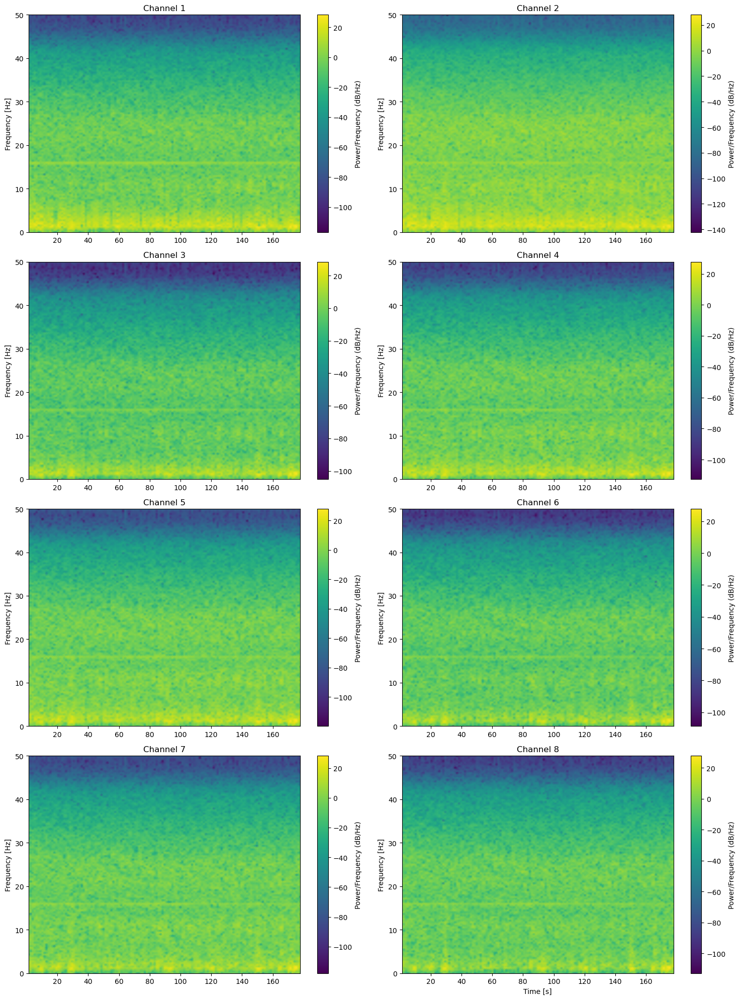

In [14]:
import numpy as np
import polars as pl
import matplotlib.pyplot as plt
from scipy import signal

# Load the data

# Extract EEG channels (assuming ch1 to ch8 are the EEG channels)
eeg_data = df.select(
    ["ch1", "ch2", "ch3", "ch4", "ch5", "ch6", "ch7", "ch8"]
).to_numpy()

# Set parameters
# fs = 1 / (df['timestamp'][1] - df['timestamp'][0])  # Sampling frequency
fs = 500
nperseg = 256  # Length of each segment
noverlap = nperseg // 2  # 50% overlap

# Decimate the data to 100 Hz
eeg_data = signal.decimate(eeg_data, 5, axis=0, zero_phase=True)
fs = fs / 5

# Perform STFT on each channel
f, t, Sxx = signal.spectrogram(eeg_data.T, fs=fs, nperseg=nperseg, noverlap=noverlap)

# Plot time-frequency spectrograms for each channel
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i in range(8):
    im = axs[i].pcolormesh(t, f, 10 * np.log10(Sxx[i]), shading="gouraud")
    axs[i].set_ylabel("Frequency [Hz]")
    axs[i].set_title(f"Channel {i+1}")
    # set y-axis limits
    # axs[i].set_ylim(0, 50)
    fig.colorbar(im, ax=axs[i], label="Power/Frequency (dB/Hz)")

axs[-1].set_xlabel("Time [s]")
plt.tight_layout()
plt.show()


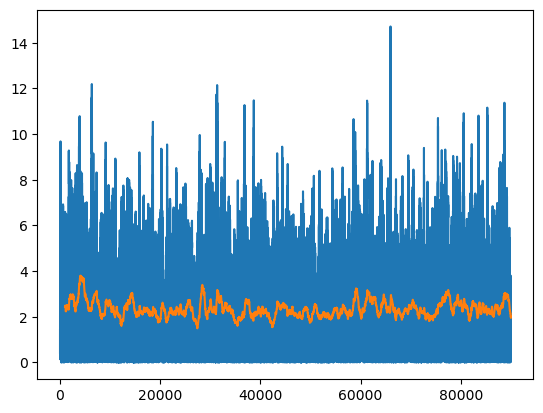

In [19]:
ch = df.get_column("ch4").to_numpy()

# Define the filter
lowcut = 13
highcut = 30
ch = filter_butterworth(ch, sample_rate=250, lowcut=lowcut, highcut=highcut)
coef, freqs = pywt.cwt(ch, np.arange(2, 19), "morl")

# only keep positive values
coef = np.abs(coef)
a = bn.move_mean(coef[10], window=1000)
plt.plot(coef[10])
plt.plot(a)

In [20]:
scale_min_max(df.hstack(pl.from_numpy(a))).hvplot(
    x="timestamp", y="column_0"
) * plot_modality_over_trials("stimulus", specific_trial=trial)

BokehModel(combine_events=True, render_bundle={'docs_json': {'24ecc522-f496-4f63-8d07-891dc2b513fd': {'version…

In [7]:
plot_modality_over_trials("stimulus", specific_trial=13)

BokehModel(combine_events=True, render_bundle={'docs_json': {'cda99044-b6c1-4e0f-ab18-b4c9b9341a02': {'version…

In [8]:
df

trial_id,trial_number,participant_id,rownumber,timestamp,ch1,ch2,ch3,ch4,ch5,ch6,ch7,ch8
u16,u8,u8,u32,f64,f64,f64,f64,f64,f64,f64,f64,f64
13,1,2,114281,228586.9844,-2.960767,-7.605212,-1.451654,-2.959252,-2.613291,-3.684725,0.517067,0.631767
13,1,2,114282,228592.3516,-2.124461,-7.082084,0.312595,-2.09998,-3.176665,-0.244426,0.353985,4.330136
13,1,2,114283,228592.4014,-1.312831,-6.573002,1.975868,-1.368195,-3.694065,2.995599,0.250427,7.905983
13,1,2,114284,228592.4674,-0.567501,-6.109886,3.431351,-0.8947,-4.147149,5.859482,0.237681,11.230819
13,1,2,114285,228594.595,0.065152,-5.733008,4.58569,-0.78346,-4.530663,8.202802,0.331548,14.193528
13,1,2,114286,228596.6236,0.534084,-5.492698,5.365006,-1.101692,-4.855491,9.924546,0.528627,16.707373
…,…,…,…,…,…,…,…,…,…,…,…,…
13,1,2,204276,408581.4077,3.196602,0.567888,1.594367,12.24129,9.770133,-12.660332,15.51289,4.672356
13,1,2,204277,408583.3476,3.999248,2.178355,2.67402,12.679767,10.501499,-10.379809,15.458516,5.89498


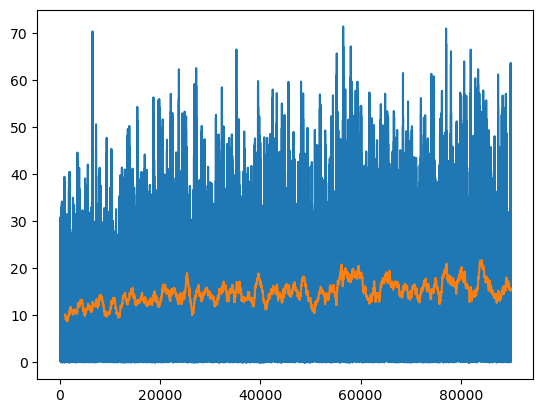

In [9]:
ch = df.get_column("ch4").to_numpy()

# Define the filter
lowcut = 13
highcut = 30
# ch = filter_butterworth(ch, sample_rate=250, lowcut=lowcut, highcut=highcut)
coef, freqs = pywt.cwt(ch, np.arange(2, 19), "morl")

# only keep positive values
coef = np.abs(coef)
a = bn.move_mean(coef[10], window=1000)
plt.plot(coef[10])
plt.plot(a)

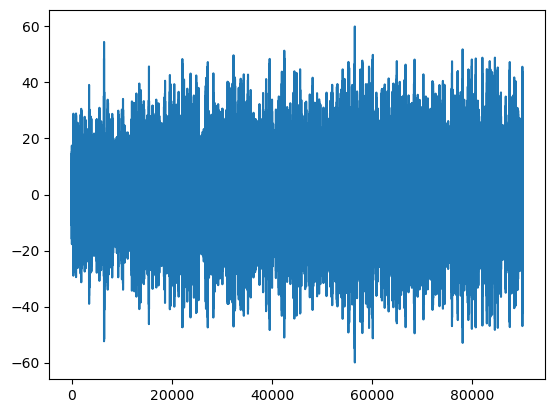

In [45]:
a = bn.move_mean(ch, window=10)
plt.plot(coef[10])
# plt.plot(a)


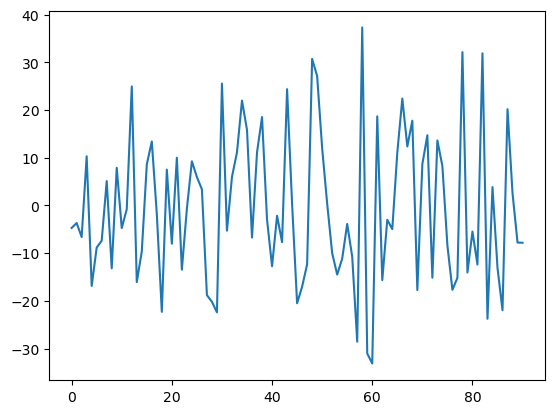

In [30]:
plt.plot(coef[10][::1000])

bn.move_mean(ch, window=1000, min_count=1)

In [68]:
pl.DataFrame({"wave": a}).hvplot.line()

:Curve   [index]   (wave)

In [75]:
df = df.hstack(pl.DataFrame({"wave": a}))
df

trial_id,trial_number,participant_id,rownumber,timestamp,ch1,ch2,ch3,ch4,ch5,ch6,ch7,ch8,wave
u16,u8,u8,u32,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
13,1,2,114281,228586.9844,-2.960767,-7.605212,-1.451654,-2.959252,-2.613291,-3.684725,0.517067,0.631767,NaN
13,1,2,114282,228592.3516,-2.124461,-7.082084,0.312595,-2.09998,-3.176665,-0.244426,0.353985,4.330136,NaN
13,1,2,114283,228592.4014,-1.312831,-6.573002,1.975868,-1.368195,-3.694065,2.995599,0.250427,7.905983,NaN
13,1,2,114284,228592.4674,-0.567501,-6.109886,3.431351,-0.8947,-4.147149,5.859482,0.237681,11.230819,NaN
13,1,2,114285,228594.595,0.065152,-5.733008,4.58569,-0.78346,-4.530663,8.202802,0.331548,14.193528,NaN
13,1,2,114286,228596.6236,0.534084,-5.492698,5.365006,-1.101692,-4.855491,9.924546,0.528627,16.707373,NaN
…,…,…,…,…,…,…,…,…,…,…,…,…,…
13,1,2,204276,408581.4077,3.196602,0.567888,1.594367,12.24129,9.770133,-12.660332,15.51289,4.672356,11.319674
13,1,2,204277,408583.3476,3.999248,2.178355,2.67402,12.679767,10.501499,-10.379809,15.458516,5.89498,11.316014


In [77]:
query = """
SELECT * 
FROM Feature_Stimulus
WHERE trial_id = 13
"""
with db:
    d = db.execute(query).pl()

d.plot(x="timestamp", y="rating") * scale_min_max(df).plot(x="timestamp", y="wave")

:Overlay
   .Curve.I  :Curve   [timestamp]   (rating)
   .Curve.II :Curve   [timestamp]   (wave)

In [ ]:
d.plot(x="timestamp", y="rating") * pl.DataFrame({"wave": a}).hvplot.line()

In [6]:
plot_modality_over_trials("stimulus")

BokehModel(combine_events=True, render_bundle={'docs_json': {'42ffd2d3-760d-4762-ab59-c20638f99f80': {'version…

<Figure size 1000x1000 with 0 Axes>

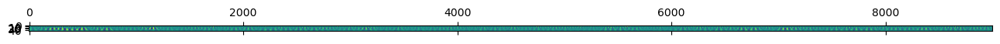

In [104]:
import pywt
import numpy as np
import matplotlib.pyplot as plt

y = df.get_column("ch4").to_numpy()[::10]
coef, freqs = pywt.cwt(y, np.arange(2, 50), "morl")
plt.figure(figsize=(10, 10))
plt.matshow(coef)
plt.show()


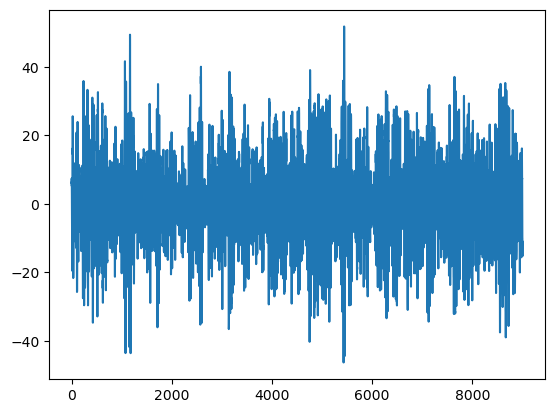

In [105]:
plt.plot(coef[16])

In [106]:
freqs

array([0.40625   , 0.27083333, 0.203125  , 0.1625    , 0.13541667,
       0.11607143, 0.1015625 , 0.09027778, 0.08125   , 0.07386364,
       0.06770833, 0.0625    , 0.05803571, 0.05416667, 0.05078125,
       0.04779412, 0.04513889, 0.04276316, 0.040625  , 0.03869048,
       0.03693182, 0.03532609, 0.03385417, 0.0325    , 0.03125   ,
       0.03009259, 0.02901786, 0.02801724, 0.02708333, 0.02620968,
       0.02539062, 0.02462121, 0.02389706, 0.02321429, 0.02256944,
       0.02195946, 0.02138158, 0.02083333, 0.0203125 , 0.01981707,
       0.01934524, 0.01889535, 0.01846591, 0.01805556, 0.01766304,
       0.01728723, 0.01692708, 0.01658163])

(8.0, 14.0)

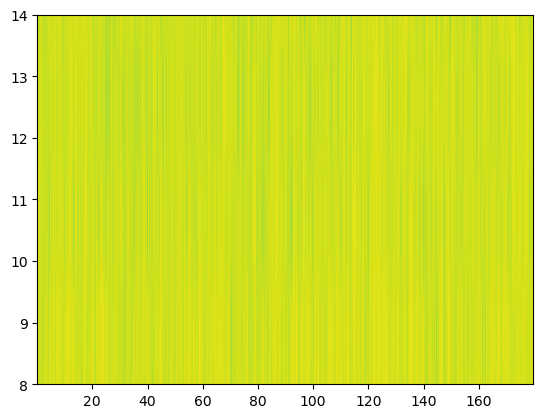

In [107]:
plt.specgram(df["ch4"], Fs=500);
# set y-axis to be in Hz
plt.ylim(8, 14)

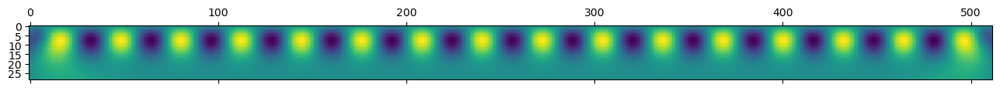

In [108]:
>>> import pywt
>>> import numpy as np
>>> import matplotlib.pyplot as plt
>>> x = np.arange(512)
>>> y = np.sin(2*np.pi*x/32)
>>> coef, freqs=pywt.cwt(y,np.arange(1,30),'gaus1')
>>> plt.matshow(coef)
>>> plt.show()

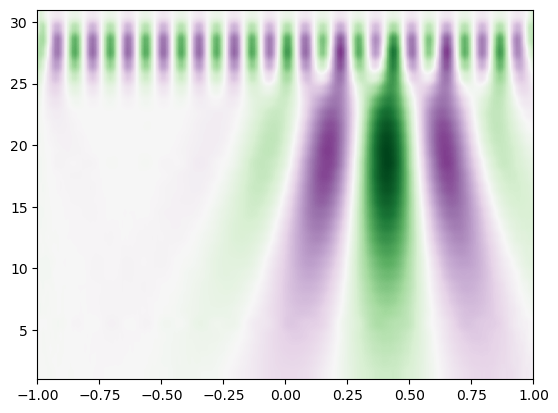

In [109]:
>>> import pywt
>>> import numpy as np
>>> import matplotlib.pyplot as plt
>>> t = np.linspace(-1, 1, 200, endpoint=False)
>>> sig  = np.cos(2 * np.pi * 7 * t) + np.real(np.exp(-7*(t-0.4)**2)*np.exp(1j*2*np.pi*2*(t-0.4)))
>>> widths = np.arange(1, 31)
>>> cwtmatr, freqs = pywt.cwt(sig, widths, 'mexh')
>>> plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
...            vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
>>> plt.show()

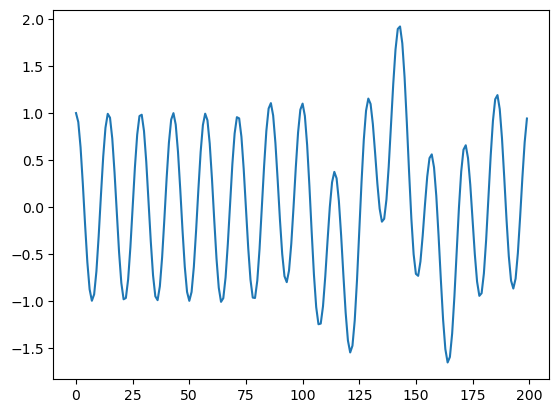

In [110]:
plt.plot(sig)

Text(0.5, 0, 'Time [sec]')

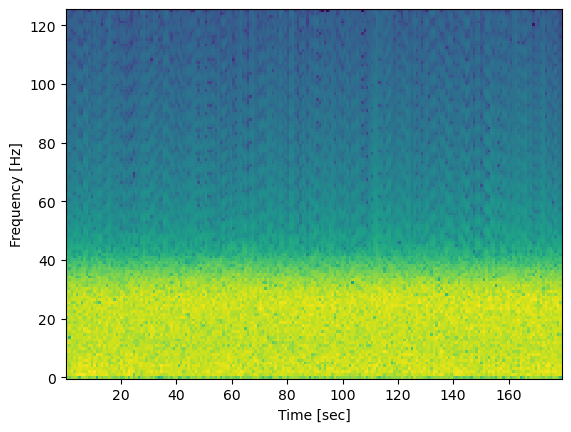

In [111]:
ch = df.get_column("ch4").to_numpy()[::2]
ch = filter_butterworth(ch, sample_rate=250, lowcut=1, highcut=35)

# Define the filter
lowcut = 13
highcut = 30
# ch= filter_butterworth(ch, sample_rate=250, lowcut=lowcut, highcut=highcut)
# plt.plot(ch)

# Time frequency analysis
f, t, Sxx = signal.spectrogram(ch, 250)
plt.pcolormesh(t, f, 10 * np.log10(Sxx))
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")

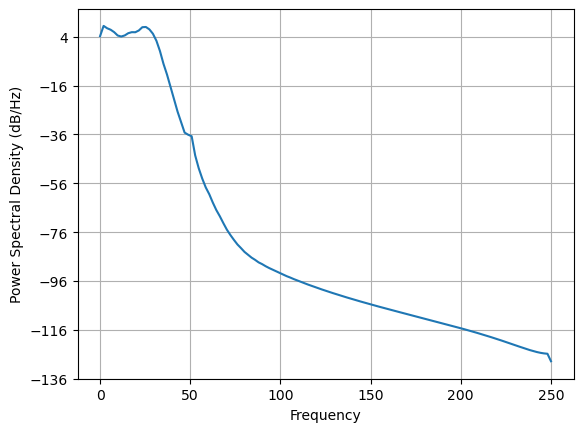

In [112]:
def plot_psd(df: pl.DataFrame, channel: str, fs: int):
    data = df.get_column(channel).to_numpy()
    plt.psd(data, Fs=fs)


plot_psd(df, "ch4", 500)

(array([2.64166180e+00, 6.93309125e+00, 5.55204084e+00, 4.82647821e+00,
        3.84376134e+00, 2.80090826e+00, 2.54526831e+00, 2.81902505e+00,
        3.48398657e+00, 3.83648050e+00, 3.81088008e+00, 4.49766732e+00,
        6.12412007e+00, 6.25256727e+00, 4.98533054e+00, 3.30813776e+00,
        1.69780316e+00, 6.46106280e-01, 1.94134401e-01, 7.07694131e-02,
        2.17978884e-02, 6.95415065e-03, 2.14374913e-03, 7.99067871e-04,
        2.97240409e-04, 2.43719242e-04, 2.10753786e-04, 3.45990448e-05,
        1.03672878e-05, 3.91434584e-06, 1.69550792e-06, 8.92432493e-07,
        4.07472374e-07, 2.00974959e-07, 1.11788347e-07, 5.84079500e-08,
        3.15703638e-08, 1.90933021e-08, 1.20650480e-08, 7.85251727e-09,
        5.57961472e-09, 3.89309461e-09, 2.96120597e-09, 2.27285114e-09,
        1.84265316e-09, 1.45264272e-09, 1.23194130e-09, 1.01144818e-09,
        8.51261147e-10, 7.27841438e-10, 6.18135775e-10, 5.30213633e-10,
        4.59460309e-10, 3.94275935e-10, 3.46500993e-10, 3.001614

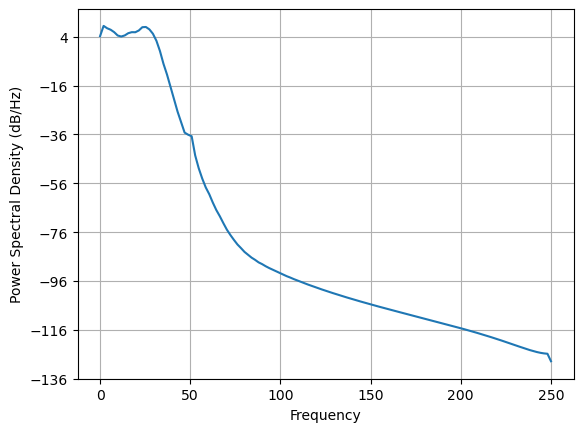

In [113]:
plt.psd(df.get_column("ch4").to_numpy(), Fs=500)

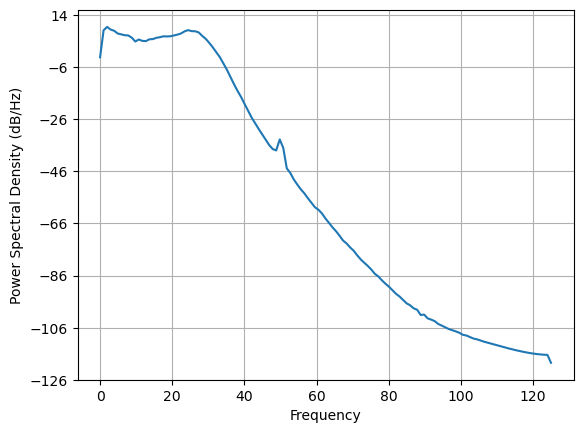

In [114]:
data = df.get_column("ch4").to_numpy()
fil = signal.decimate(data, 2, zero_phase=True)
plt.psd(fil, Fs=250);

In [115]:
new_sample_rate = 250

In [116]:
@map_trials
def downsample(
    df: pl.DataFrame,
    new_sample_rate: int = 10,
) -> pl.DataFrame:
    # Find out current sampling rate
    current_sample_rate = round(
        1000
        / (
            df.filter(col("trial_id") == df.select(pl.first("trial_id")))
            .get_column("timestamp")
            .diff()
            .mean()
        )
    )
    if new_sample_rate >= current_sample_rate:
        raise ValueError(
            f"New sample rate {new_sample_rate} must be smaller than current sample "
            f"rate {current_sample_rate}"
        )

    # Add time column in µs for integer data type so that group_by_dynamic works
    df = add_timestamp_µs_column(df)
    # Downsample using group_by_dynamic
    df = df.group_by_dynamic(
        "timestamp_µs", every=f"{int((1000 / new_sample_rate)*1000)}i"
    ).agg(pl.all().mean())
    # Reverse the timestamp_µs column to timestamp in ms
    df = df.with_columns(
        (col("timestamp_µs") / 1000).alias("timestamp"),
        col("trial_id").cast(pl.UInt16),
        col(["trial_number", "participant_id"]).cast(pl.UInt8),
        # we should also cast the other columns to the correct data type TODO
    ).drop("timestamp_µs")

    return df


def add_timestamp_µs_column(
    df: pl.DataFrame,
    time_column: str = "timestamp",
) -> pl.DataFrame:
    """
    Create a new column that contains the timestamp in microseconds (µs).

    Casts the datatype to Int64 which allow group_by_dynamic operations.
    """
    return df.with_columns(
        (col(time_column) * 1000).cast(pl.Int64).alias(time_column + "_µs")
    )


no_anti_aliasing = downsample(df, new_sample_rate=new_sample_rate)

In [117]:
def robust_downsample(
    df: pl.DataFrame,
    new_sample_rate: int,
    low_pass_cutoff: float = None,
) -> pl.DataFrame:
    # Find out current sampling rate
    current_sample_rate = round(
        1000
        / (
            df.filter(pl.col("trial_id") == df.select(pl.first("trial_id")))
            .get_column("timestamp")
            .diff()
            .mean()
        )
    )

    if new_sample_rate >= current_sample_rate:
        raise ValueError(
            f"New sample rate {new_sample_rate} must be smaller than current sample "
            f"rate {current_sample_rate}"
        )

    # Calculate decimation factor
    decimate_factor = int(current_sample_rate / new_sample_rate)

    # Set low-pass filter cutoff frequency if not provided
    if low_pass_cutoff is None:
        low_pass_cutoff = 0.8 * (new_sample_rate / 2)  # 80% of new Nyquist frequency

    # Define filter
    nyquist = 0.5 * current_sample_rate
    normal_cutoff = low_pass_cutoff / nyquist
    b, a = signal.butter(8, normal_cutoff, btype="low", analog=False)

    # Function to apply filtering and decimation to a single column
    def filter_and_decimate(col):
        filtered = signal.filtfilt(b, a, col)
        return filtered[::decimate_factor]

    # Identify EEG data columns
    eeg_columns = [
        col
        for col in df.columns
        if col not in ["timestamp", "trial_id", "trial_number", "participant_id"]
    ]

    # Apply filtering and decimation to EEG data columns
    downsampled_data = {
        col: filter_and_decimate(df[col].to_numpy()) for col in eeg_columns
    }

    # Handle timestamps
    original_timestamps = df["timestamp"].to_numpy()
    downsampled_timestamps = original_timestamps[::decimate_factor]

    # Create new DataFrame
    new_df = pl.DataFrame(
        {
            "timestamp": downsampled_timestamps,
            "trial_id": df["trial_id"][::decimate_factor].cast(pl.UInt16),
            "trial_number": df["trial_number"][::decimate_factor].cast(pl.UInt8),
            "participant_id": df["participant_id"][::decimate_factor].cast(pl.UInt8),
            **{col: downsampled_data[col] for col in eeg_columns},
        }
    )

    return new_df


anti_aliasing = robust_downsample(df, new_sample_rate=new_sample_rate)


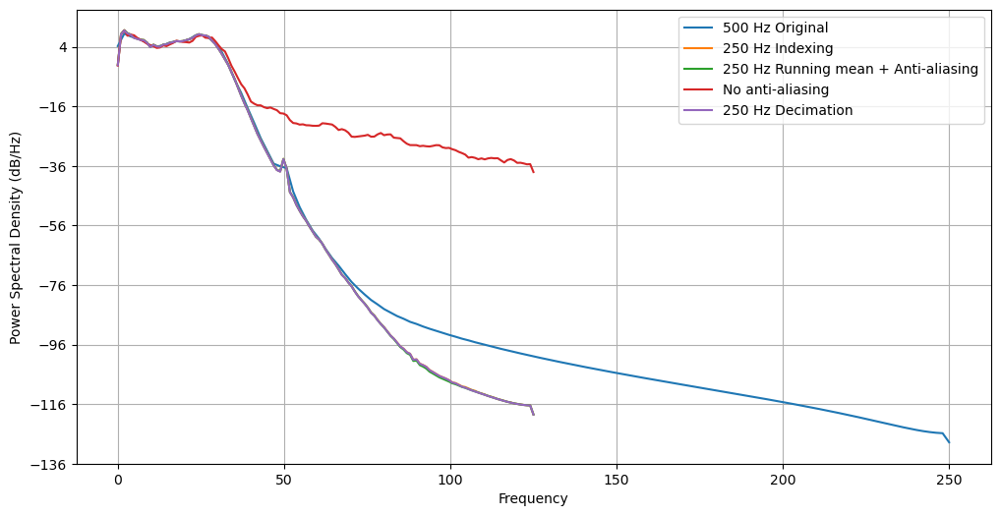

In [118]:
channel = "ch4"
plt.figure(figsize=(12, 6))
plt.psd(df.get_column(channel).to_numpy(), Fs=500, label="500 Hz Original")
plt.psd(df.get_column(channel).to_numpy()[::2], Fs=250, label="250 Hz Indexing")
plt.psd(
    anti_aliasing.get_column(channel).to_numpy(),
    Fs=new_sample_rate,
    label="250 Hz Running mean + Anti-aliasing",
)
plt.psd(
    no_anti_aliasing.get_column(channel).to_numpy(),
    Fs=new_sample_rate,
    label="No anti-aliasing",
)
plt.psd(fil, Fs=250, label="250 Hz Decimation")
plt.legend()


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
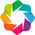

ValueError: too many values to unpack (expected 2)

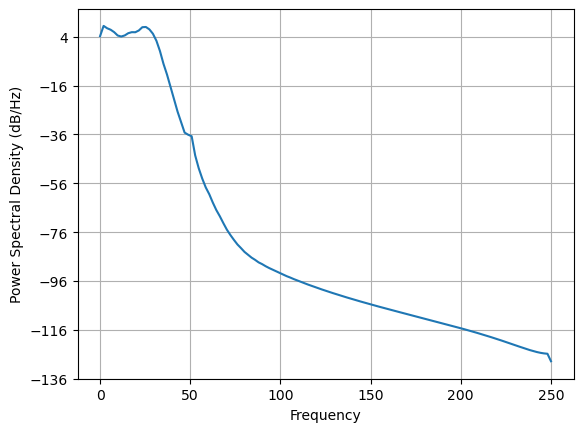

In [119]:
import holoviews as hv
import numpy as np
from holoviews import opts

hv.extension("bokeh")


def compute_psd(data, fs):
    f, pxx = plt.psd(data, Fs=fs, return_line=True)
    return hv.Curve((f, 10 * np.log10(pxx)), "Frequency", "PSD")


channel = "ch4"
new_sample_rate = 250

curves = [
    compute_psd(df.get_column(channel).to_numpy(), 500).relabel("500 Hz Original"),
    compute_psd(df.get_column(channel).to_numpy()[::2], 250).relabel("250 Hz Indexing"),
    compute_psd(anti_aliasing.get_column(channel).to_numpy(), new_sample_rate).relabel(
        "250 Hz Running mean + Anti-aliasing"
    ),
    compute_psd(
        no_anti_aliasing.get_column(channel).to_numpy(), new_sample_rate
    ).relabel("No anti-aliasing"),
    compute_psd(fil, 250).relabel("250 Hz Decimation"),
]

overlay = hv.Overlay(curves)

overlay.opts(
    opts.Curve(width=800, height=400, tools=["hover"], title="Power Spectral Density"),
    opts.Overlay(legend_position="right"),
)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
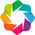

figure(id='p1849', ...)

In [44]:
import holoviews as hv
import numpy as np
from holoviews import opts
from scipy import signal

hv.extension("bokeh")


def compute_psd(data, fs):
    f, pxx = signal.welch(data, fs, nperseg=1024)
    return hv.Curve((f, 10 * np.log10(pxx)), "Frequency", "PSD (dB/Hz)")


channel = "ch4"
new_sample_rate = 250

curves = [
    compute_psd(df.get_column(channel).to_numpy(), 500).relabel("500 Hz Original"),
    compute_psd(df.get_column(channel).to_numpy()[::2], 250).relabel("250 Hz Indexing"),
    compute_psd(anti_aliasing.get_column(channel).to_numpy(), new_sample_rate).relabel(
        "250 Hz Running mean + Anti-aliasing"
    ),
    compute_psd(
        no_anti_aliasing.get_column(channel).to_numpy(), new_sample_rate
    ).relabel("250 Hz Running mean + No anti-aliasing"),
    compute_psd(fil, 250).relabel("250 Hz Scipy decimate"),
]

overlay = hv.Overlay(curves)

overlay.opts(
    opts.Curve(width=800, height=400, tools=["hover"], title="Power Spectral Density"),
    opts.Overlay(legend_position="right"),
)
# hv.render(overlay)
display(hv.render(overlay))
# hv.save(overlay, 'psd_plot.html')


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
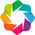

12:41:11 | WARNING | param.OverlayPlot00966 | Logarithmic axis range encountered value less than or equal to zero, please supply explicit lower bound to override default of 0.010.


figure(id='p1020', ...)

In [12]:
import holoviews as hv
import numpy as np
from holoviews import opts

hv.extension("bokeh")

channel = "ch4"
Fs_original = 500
Fs_new = 250


def compute_psd(data, Fs):
    f, Pxx = np.fft.fftfreq(len(data), 1 / Fs), np.abs(np.fft.fft(data)) ** 2
    return hv.Curve((f[: len(f) // 2], Pxx[: len(Pxx) // 2]), "Frequency", "PSD")


original = compute_psd(df.get_column(channel).to_numpy(), Fs_original).relabel(
    "500 Hz Original"
)
indexing = compute_psd(df.get_column(channel).to_numpy()[::2], Fs_new).relabel(
    "250 Hz Indexing"
)
anti_aliasing = compute_psd(
    anti_aliasing.get_column(channel).to_numpy(), Fs_new
).relabel("250 Hz Running mean + Anti-aliasing")
no_anti_aliasing = compute_psd(
    no_anti_aliasing.get_column(channel).to_numpy(), Fs_new
).relabel("No anti-aliasing")
decimation = compute_psd(fil, Fs_new).relabel("250 Hz Decimation")

plot = (original * indexing * anti_aliasing * no_anti_aliasing * decimation).opts(
    opts.Curve(
        width=800,
        height=400,
        logx=True,
        logy=True,
        xlabel="Frequency (Hz)",
        ylabel="PSD",
    )
)

hv.render(plot)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
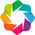

ValueError: Options must be defined in one of two formats. Either supply keywords defining the options for the current object, e.g. obj.options(cmap='viridis'), or explicitly define the type, e.g. obj.options({'Image': {'cmap': 'viridis'}}). Supplying both formats is not supported.

In [24]:
import holoviews as hv
import numpy as np
from holoviews import opts

hv.extension("bokeh")

channel = "ch4"
Fs_original = 500
Fs_new = 250


def compute_psd(data, Fs):
    f, Pxx = np.fft.fftfreq(len(data), 1 / Fs), np.abs(np.fft.fft(data)) ** 2
    # Filter out zero and negative values
    mask = (f > 0) & (Pxx > 0)
    return hv.Curve((f[mask], Pxx[mask]), "Frequency", "PSD")


original = compute_psd(df.get_column(channel).to_numpy(), Fs_original).relabel(
    "500 Hz Original"
)
indexing = compute_psd(df.get_column(channel).to_numpy()[::2], Fs_new).relabel(
    "250 Hz Indexing"
)
anti_aliasing = compute_psd(
    anti_aliasing.get_column(channel).to_numpy(), Fs_new
).relabel("250 Hz Running mean + Anti-aliasing")
no_anti_aliasing = compute_psd(
    no_anti_aliasing.get_column(channel).to_numpy(), Fs_new
).relabel("No anti-aliasing")
decimation = compute_psd(fil, Fs_new).relabel("250 Hz Decimation")

plot = (original * indexing * anti_aliasing * no_anti_aliasing * decimation).opts(
    opts.Curve(
        width=800,
        height=400,
        logx=True,
        logy=True,
        xlabel="Frequency (Hz)",
        ylabel="PSD",
    ),
    xlim=(1, None),  # Set lower x-limit to 1 Hz
    ylim=(1e-10, None),  # Set lower y-limit to a small positive value
)

hv.render(plot)


In [12]:
fil

array([3222.2116947 , 3233.06555453, 3240.48624278, ..., 3230.51223431,
       3256.99004553, 3234.58906232])

In [11]:
anti_aliasing.plot(
    x="timestamp", y=["ch1", "ch2"], groupby="trial_number", kind="line"
) * no_anti_aliasing.plot(
    x="timestamp", y=["ch1", "ch2"], groupby="trial_number", kind="line", alpha=0.5
)

BokehModel(combine_events=True, render_bundle={'docs_json': {'cf6fa4fc-2e2c-42ff-882e-d2177f1a2ae8': {'version…

In [ ]:
@map_trials
def filter_eeg(
    df: pl.DataFrame,
    sample_rate: int = SAMPLE_RATE,
    channel_columns: list[str] = CHANNELS,
) -> pl.DataFrame:
    return df.with_columns(
        col(channel_columns).map_batches(
            lambda x: filter_butterworth(
                x.to_numpy(),
                sample_rate,
                lowcut=1,
                highcut=35,
            )
        )  # .name.suffix("_filtered") TODO naming convention
    )


In [ ]:
anti_aliasing.plot(
    x="timestamp", y=["ch1", "ch2"], groupby="trial_number", kind="line"
) * no_anti_aliasing.plot(
    x="timestamp", y=["ch1", "ch2"], groupby="trial_number", kind="line", alpha=0.5
)

In [ ]:
import polars as pl
import numpy as np
from scipy import signal


def downsample_eeg(
    df: pl.DataFrame, new_sample_rate: int, columns_to_downsample: list[str]
) -> pl.DataFrame:
    """
    Downsample EEG data with proper anti-aliasing filter.

    :param df: Input DataFrame with EEG data
    :param new_sample_rate: Target sampling rate
    :param columns_to_downsample: List of column names containing EEG data to downsample
    :return: Downsampled DataFrame
    """
    # Calculate current sample rate
    current_sample_rate = round(1000 / df.select(pl.col("timestamp").diff().mean()))

    if new_sample_rate >= current_sample_rate:
        raise ValueError(
            f"New sample rate {new_sample_rate} must be smaller than current sample rate {current_sample_rate}"
        )

    # Calculate downsampling factor
    downsample_factor = current_sample_rate // new_sample_rate

    # Design anti-aliasing filter
    nyquist_freq = 0.5 * current_sample_rate
    cutoff_freq = 0.8 * (new_sample_rate / 2)  # 80% of new Nyquist frequency
    b, a = signal.butter(10, cutoff_freq / nyquist_freq, btype="low", analog=False)

    # Function to apply filtering and downsampling to a single column
    def filter_and_downsample(col):
        filtered = signal.filtfilt(b, a, col)
        return filtered[::downsample_factor]

    # Apply downsampling to specified columns
    downsampled_data = {
        col: filter_and_downsample(df[col].to_numpy()) for col in columns_to_downsample
    }

    # Downsample timestamps
    new_timestamps = df["timestamp"].to_numpy()[::downsample_factor]

    # Create new DataFrame with downsampled data
    new_df = pl.DataFrame({"timestamp": new_timestamps, **downsampled_data})

    # Add other non-EEG columns
    other_columns = [
        col for col in df.columns if col not in ["timestamp"] + columns_to_downsample
    ]
    for col in other_columns:
        new_df = new_df.with_columns(df[col].to_numpy()[::downsample_factor].alias(col))

    return new_df


# Example usage:
# downsampled_df = downsample_eeg(df, new_sample_rate=250, columns_to_downsample=['channel1', 'channel2', ...])


In [123]:
import numpy as np
import polars as pl
import pywt

SAMPLE_RATE = 500
CHANNELS = ["ch1", "ch2", "ch3", "ch4", "ch5", "ch6", "ch7", "ch8"]
CHANNELS = ["ch5"]


def wavelet_transform(signal, fs, freqs, wavelet="morl"):
    scales = fs / (2 * freqs)
    cwt = pywt.cwt(signal, scales, wavelet)
    return cwt[0]


def compute_alpha_power(signal, sample_rate):
    freqs = np.linspace(7.5, 13, 20)
    cwt_matrix = wavelet_transform(signal, sample_rate, freqs)
    power = np.square(np.abs(cwt_matrix))
    avg_power = np.mean(power, axis=0)
    return avg_power


@map_trials
def analyze_alpha_wavelet(
    df: pl.DataFrame,
    sample_rate: int = SAMPLE_RATE,
    channel_columns: list[str] = CHANNELS,
) -> pl.DataFrame:
    return df.with_columns(
        [
            pl.col(channel)
            .map_batches(lambda x: compute_alpha_power(x.to_numpy(), sample_rate))
            .alias(f"{channel}_alpha_power")
            for channel in channel_columns
        ]
    )


df = analyze_alpha_wavelet(df)

In [126]:
df

trial_id,trial_number,participant_id,rownumber,timestamp,ch1,ch2,ch3,ch4,ch5,ch6,ch7,ch8,ch5_alpha_power
u16,u8,u8,u32,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
13,1,2,114281,228586.9844,-2.960767,-7.605212,-1.451654,-2.959252,-2.613291,-3.684725,0.517067,0.631767,89.595812
13,1,2,114282,228592.3516,-2.124461,-7.082084,0.312595,-2.09998,-3.176665,-0.244426,0.353985,4.330136,80.048743
13,1,2,114283,228592.4014,-1.312831,-6.573002,1.975868,-1.368195,-3.694065,2.995599,0.250427,7.905983,66.941563
13,1,2,114284,228592.4674,-0.567501,-6.109886,3.431351,-0.8947,-4.147149,5.859482,0.237681,11.230819,51.395309
13,1,2,114285,228594.595,0.065152,-5.733008,4.58569,-0.78346,-4.530663,8.202802,0.331548,14.193528,35.605578
13,1,2,114286,228596.6236,0.534084,-5.492698,5.365006,-1.101692,-4.855491,9.924546,0.528627,16.707373,21.753446
…,…,…,…,…,…,…,…,…,…,…,…,…,…
13,1,2,204276,408581.4077,3.196602,0.567888,1.594367,12.24129,9.770133,-12.660332,15.51289,4.672356,208.956348
13,1,2,204277,408583.3476,3.999248,2.178355,2.67402,12.679767,10.501499,-10.379809,15.458516,5.89498,217.263572


In [127]:
scale_min_max(df).plot(
    x="timestamp",
    y=[
        # "ch1_alpha_power",
        # "ch2_alpha_power",
        # "ch3_alpha_power",
        # "ch4_alpha_power",
        "ch5_alpha_power",
        # "ch6_alpha_power",
        # "ch7_alpha_power",
        # "ch8_alpha_power",
    ],
    groupby="trial_id",
    kind="line",
    width=800,
    height=400,
) * plot_modality_over_trials("stimulus")

14:38:57 | WARNING | param.OverlayPlot01872 | No plotting class for DynamicMap type and bokeh backend found. 


14:38:57 | WARNING | param.OverlayPlot01872 | No plotting class for DynamicMap type and bokeh backend found. 


BokehModel(combine_events=True, render_bundle={'docs_json': {'892cba6d-8f0c-4b86-8cc5-a568d31c4733': {'version…

In [128]:
plot_modality_over_trials("stimulus")

BokehModel(combine_events=True, render_bundle={'docs_json': {'f8c4b923-ddce-4c93-a484-9bc2cfbe956d': {'version…

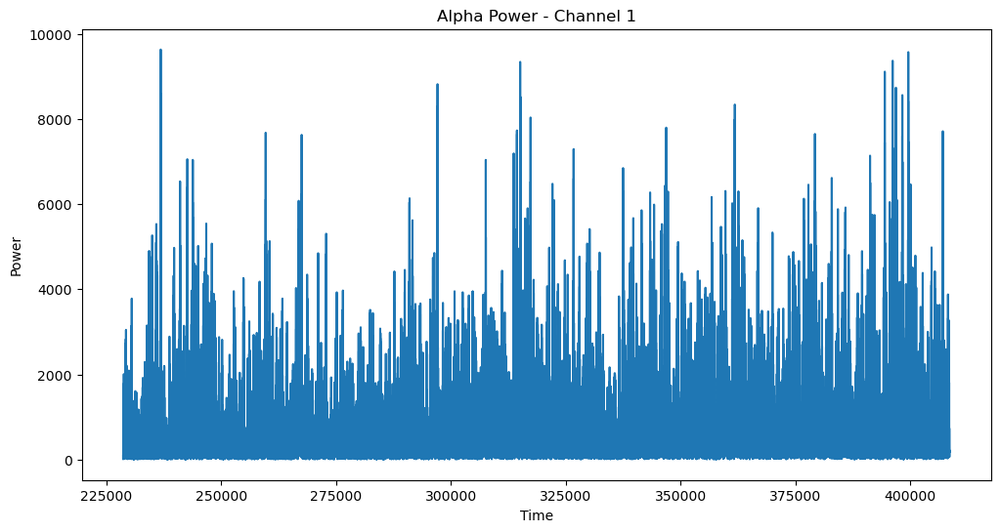

In [130]:
# TODO: wavelet analysis using pywt:

import numpy as np
import pywt
import matplotlib.pyplot as plt


def wavelet_transform(signal, fs, freqs, wavelet="morl"):
    """
    Perform continuous wavelet transform.

    Parameters:
    signal (array): Input signal
    fs (float): Sampling frequency
    freqs (array): Frequencies to analyze
    wavelet (str): Wavelet to use (default: 'morl' for Morlet)

    Returns:
    cwt (2D array): Wavelet coefficients
    """
    scales = fs / (2 * freqs)
    cwt = pywt.cwt(signal, scales, wavelet)
    return cwt[0]


@map_trials
def analyze_alpha_wavelet(
    df: pl.DataFrame,
    sample_rate: int = 500,
    channel_columns: list[str] = [
        "ch1",
        "ch2",
        "ch3",
        "ch4",
        "ch5",
        "ch6",
        "ch7",
        "ch8",
    ],
) -> pl.DataFrame:
    # Define frequencies for alpha band
    freqs = np.linspace(7.5, 13, 20)

    for channel in channel_columns:
        signal = df[channel].to_numpy()

        # Perform wavelet transform
        cwt_matrix = wavelet_transform(signal, sample_rate, freqs)

        # Compute power (squared magnitude of coefficients)
        power = np.square(np.abs(cwt_matrix))

        # Average power across frequencies
        avg_power = np.mean(power, axis=0)

        # Add to dataframe
        df = df.with_columns(pl.Series(f"{channel}_alpha_power", avg_power))

    return df


# Apply the wavelet analysis
df_wavelet = analyze_alpha_wavelet(df)

# Plotting example for the first channel
plt.figure(figsize=(12, 6))
plt.plot(df_wavelet["timestamp"], df_wavelet["ch5_alpha_power"])
plt.title("Alpha Power - Channel 1")
plt.xlabel("Time")
plt.ylabel("Power")
plt.show()


In [134]:
df_wavelet.plot(
    x="timestamp",
    y=["ch1_alpha_power", "ch2_alpha_power", "ch3_alpha_power", "ch4_alpha_power"],
    groupby="trial_id",
    kind="line",
    width=800,
    height=400,
)


BokehModel(combine_events=True, render_bundle={'docs_json': {'e72e6a2c-96a7-4cd3-85be-c4aabefa3561': {'version…

In [131]:
df.hvplot(
    x="timestamp",
    y=["ch5", "ch5_filtered"],
    groupby="trial_id",
)

ValueError: 'ch5_filtered' is not in list

In [15]:
channel_columns: list[str] = [
    "ch1_filtered",
    "ch2_filtered",
    "ch3_filtered",
    "ch4_filtered",
    "ch5_filtered",
    "ch6_filtered",
    "ch7_filtered",
    "ch8_filtered",
]


@map_trials
def filter_eeg(
    df: pl.DataFrame,
    sample_rate: int = 500,
    channel_columns: list[str] = [
        "ch1_filtered",
        "ch2_filtered",
        "ch3_filtered",
        "ch4_filtered",
        "ch5_filtered",
        "ch6_filtered",
        "ch7_filtered",
        "ch8_filtered",
    ],
) -> pl.DataFrame:
    for channel in channel_columns:
        data = filter_butterworth(
            df.get_column(channel),
            sample_rate,
            lowcut=7.5,
            highcut=13,
        )
        series = pl.Series(channel + "_alpha", data)
        df = df.with_columns(series)
    return df


alpha = filter_eeg(df)


In [16]:
from scipy.signal import hilbert
import numpy as np


@map_trials
def calculate_envelope(df: pl.DataFrame, channel_columns: list[str]) -> pl.DataFrame:
    for channel in channel_columns:
        alpha_data = df[channel + "_filtered_alpha"].to_numpy()
        analytic_signal = hilbert(alpha_data)
        envelope = np.abs(analytic_signal)
        df = df.with_columns(pl.Series(channel + "_envelope", envelope))
    return df


df_with_envelope = calculate_envelope(
    alpha, [col.replace("_filtered", "") for col in channel_columns]
)


In [17]:
from scipy.signal import savgol_filter


@map_trials
def smooth_envelope(
    df: pl.DataFrame,
    channel_columns: list[str],
    window_length: int = 101,
    polyorder: int = 3,
) -> pl.DataFrame:
    for channel in channel_columns:
        envelope_data = df[channel + "_envelope"].to_numpy()
        smoothed = savgol_filter(envelope_data, window_length, polyorder)
        df = df.with_columns(pl.Series(channel + "_smooth_envelope", smoothed))
    return df


df_smoothed = smooth_envelope(
    df_with_envelope, [col.replace("_filtered", "") for col in channel_columns]
)


In [18]:
df_with_envelope.plot(x="timestamp", y=["ch5_envelope"], groupby="trial_id")

BokehModel(combine_events=True, render_bundle={'docs_json': {'633610ed-3330-4ba0-98d6-09ae32f5648c': {'version…

In [19]:
@map_trials
def calculate_stats(df: pl.DataFrame, channel_columns: list[str]) -> pl.DataFrame:
    stats = []
    for channel in channel_columns:
        envelope_data = df[channel + "_smooth_envelope"]
        stats.extend(
            [
                pl.mean(envelope_data).alias(f"{channel}_mean_amplitude"),
                pl.std(envelope_data).alias(f"{channel}_std_amplitude"),
                pl.max(envelope_data).alias(f"{channel}_max_amplitude"),
            ]
        )
    return df.with_columns(stats)


df_with_stats = calculate_stats(
    df_smoothed, [col.replace("_filtered", "") for col in channel_columns]
)


thread '<unnamed>' panicked at py-polars/src/dataframe/general.rs:352:31:
UDF failed: invalid input for `col`

Expected iterable of type `str` or `DataType`, got iterable of type 'float'.
note: run with `RUST_BACKTRACE=1` environment variable to display a backtrace


PanicException: UDF failed: invalid input for `col`

Expected iterable of type `str` or `DataType`, got iterable of type 'float'.

In [ ]:
df_smoothed

trial_id,trial_number,participant_id,rownumber,timestamp,ch1,ch2,ch3,ch4,ch5,ch6,ch7,ch8,ch1_filtered,ch2_filtered,ch3_filtered,ch4_filtered,ch5_filtered,ch6_filtered,ch7_filtered,ch8_filtered,ch1_filtered_alpha,ch2_filtered_alpha,ch3_filtered_alpha,ch4_filtered_alpha,ch5_filtered_alpha,ch6_filtered_alpha,ch7_filtered_alpha,ch8_filtered_alpha,ch1_envelope,ch2_envelope,ch3_envelope,ch4_envelope,ch5_envelope,ch6_envelope,ch7_envelope,ch8_envelope,ch1_smooth_envelope,ch2_smooth_envelope,ch3_smooth_envelope,ch4_smooth_envelope,ch5_smooth_envelope,ch6_smooth_envelope,ch7_smooth_envelope,ch8_smooth_envelope
u16,u8,u8,u32,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
1,1,1,147086,294198.4628,9948.540039,12283.850586,5801.344238,18263.294922,12240.93457,17119.123047,13553.095703,5451.536133,-4.297418,-3.6592,5.085948,1.874163,-1.827263,3.76828,1.362276,2.722342,2.027758,3.031494,1.039917,2.662283,2.670491,0.187366,1.902128,-0.342816,8.407196,9.968076,1.209265,5.13003,7.917466,0.267157,3.381473,0.417578,10.35985,11.789591,0.54089,4.713267,8.726134,0.433628,2.742003,0.577973
1,1,1,147087,294200.3867,9941.483398,12282.277344,5801.916016,18267.203125,12242.74707,17122.318359,13557.387695,5453.300781,0.692236,0.794085,1.914507,-0.389314,-0.033461,1.132587,-2.030479,0.27039,3.647178,4.781904,0.974143,3.216766,3.998018,0.067294,2.213509,-0.36908,8.879905,10.037679,0.985852,4.392442,7.801678,0.377642,2.854907,0.369333,10.619116,12.029591,0.624498,4.801065,8.959654,0.445207,2.837961,0.541819
1,1,1,147088,294202.5715,9942.960938,12290.860352,5800.676758,18270.494141,12251.998047,17126.800781,13561.726562,5462.074219,5.421559,5.035732,-0.97798,-2.436193,1.700036,-1.302359,-5.153397,-1.995905,5.20972,6.463135,0.896361,3.72359,5.266352,-0.047859,2.496224,-0.383903,9.692214,10.948637,0.925491,4.694886,8.490647,0.412831,3.00991,0.384475,10.861181,12.256066,0.703597,4.885224,9.179354,0.456517,2.930551,0.507995
1,1,1,147089,294204.4057,9963.942383,12311.935547,5811.35791,18279.601562,12267.97168,17134.095703,13567.115234,5467.701172,9.675033,8.888007,-3.370527,-4.086246,3.32319,-3.375137,-7.774139,-3.920733,6.688187,8.044409,0.807414,4.172274,6.451381,-0.156125,2.743677,-0.386952,10.172136,11.367532,0.964854,4.672364,8.763833,0.476919,2.977376,0.408742,11.086365,12.46922,0.77828,4.965778,9.385476,0.46756,3.019825,0.476468
1,1,1,147090,294206.6215,9981.442383,12317.563477,5804.109863,18269.015625,12266.636719,17120.648438,13552.333008,5452.824219,13.297499,12.228182,-5.093743,-5.190168,4.813627,-4.955865,-9.701792,-5.375559,8.056868,9.496596,0.708266,4.553256,7.530347,-0.255813,2.949701,-0.378259,10.751353,12.015488,0.922362,4.875117,9.2498,0.508178,3.085491,0.409966,11.294989,12.669253,0.84864,5.042759,9.578262,0.478337,3.105833,0.447203
1,1,1,147091,294208.5568,9996.795898,12321.043945,5787.086914,18254.662109,12260.152344,17105.152344,13534.927734,5438.041992,16.211243,15.00241,-6.048285,-5.643229,6.181059,-5.958928,-10.804258,-6.27111,9.29203,10.792788,0.599986,4.858106,8.482314,-0.345537,3.10871,-0.358225,11.162832,12.427379,0.983774,4.960102,9.541624,0.550037,3.135327,0.432305,11.487374,12.856365,0.914767,5.116199,9.757954,0.488848,3.188627,0.420167
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
1,1,1,237082,474196.1242,9534.883789,11775.161133,5160.522949,17775.251953,12088.109375,16679.240234,13117.600586,5081.986816,-9.359076,-10.432568,1.014368,-0.938935,-18.836028,-10.83957,-11.153621,-16.38296,0.215085,0.146597,0.090027,0.143847,0.082901,-0.152808,0.056109,-0.269833,2.945194,3.265436,0.099276,1.175725,2.617346,0.271504,1.057075,0.476674,3.587075,3.994879,0.177177,1.625204,3.151377,0.357868,1.224389,0.502146
1,1,1,237083,474198.1218,9522.105469,11767.817383,5170.774902,17786.599609,12093.925781,16694.595703,13133.335938,5096.48291,-8.196752,-9.959309,1.111834,-1.038083,-17.059659,-9.

In [ ]:
plot_modality_over_trials("Stimulus")

BokehModel(combine_events=True, render_bundle={'docs_json': {'8259bc34-3bef-4c0b-a7bc-c1f81b175f22': {'version…

In [ ]:
alpha.plot(
    x="timestamp",
    y=["ch5_filtered", "ch5_filtered_alpha"],
    groupby="trial_id",
)

BokehModel(combine_events=True, render_bundle={'docs_json': {'f57884d7-3edf-457b-b4be-aae5d04f828d': {'version…

In [ ]:
%%timeit

arr = df.get_column("ch5").to_numpy()
arr = filter_butterworth(
    arr,
    sample_rate=500,
    lowcut=0.5,
    # highcut=12.5,
)
# plt.plot(arr)

In [ ]:
arr = df.get_column("ch5").to_numpy()
arr = filter_butterworth(
    arr,
    sample_rate=500,
    lowcut=7.5,
    highcut=12.5,
)
plt.plot(arr)

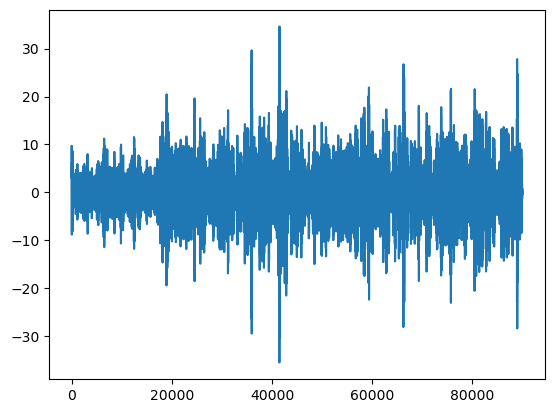

In [ ]:
arr


In [ ]:
features = [
    "ch1",
    "ch2",
    "ch3",
    "ch4",
    "ch5",
    "ch6",
    "ch7",
    "ch8",
]

(df).hvplot(
    x="timestamp",
    y=features,
    groupby="trial_id",
    kind="line",
)

BokehModel(combine_events=True, render_bundle={'docs_json': {'5d0f3284-684c-4d93-aab3-d1cf90f527ad': {'version…

In [ ]:
eeg_columns = [
    "ch1",
    "ch2",
    "ch3",
    "ch4",
    "ch5",
    "ch6",
    "ch7",
    "ch8",
]

eeg_column = "ch5"


def bandpower(
    df: pl.DataFrame,
    eeg_ch,
    band: list,
    fs: int = 500,
) -> pl.DataFrame:
    """
    Compute the average power of the signal in a specific frequency band.

    Parameters
    ----------
    df : pl.DataFrame
        The input DataFrame with the 'eeg_raw' column.
    band : list
        The frequency band of interest, e.g. [0.5, 4] for delta waves.
    fs : int
        The sampling rate of the signal in Hz.

    Returns
    -------
    pl.DataFrame
        The input DataFrame with an additional column 'bandpower' containing the average
        power of the signal in the specified frequency band.
    """
    # Compute the power spectral density of the signal
    f, Pxx = signal.welch(df[eeg_ch], fs=fs, nperseg=fs)
    # Compute the average power in the specified frequency band
    bandpower = np.mean(Pxx[(f >= band[0]) & (f <= band[1])])
    return df


df = bandpower(df, eeg_column, [0.5, 4], fs=500)
df


Bandpower: 1568.0519140710219


TypeError: Series constructor called with unsupported type 'float64' for the `values` parameter

In [ ]:
a = np.array([1, 2, 3, 4, 5])
pl.DataFrame(a)

column_0
i64
1
2
3
4
5


In [ ]:
check_sample_rate(df)

13:15:05 | DEBUG   | quality_checks | Sample rate per trial: [499.99 499.99 499.99 499.99 499.99 499.99 499.99 499.99 499.99 500.
 499.99 499.99 499.99 499.99 499.99 499.99 500.   499.99 500.   499.99
 499.99 500.   499.99 499.99 500.   499.99 499.99 499.99 499.99 500.
 499.99 500.   499.99 499.99 499.99 499.99]
13:15:05 | INFO    | quality_checks | The mean sample rate is 499.99.


In [ ]:
eeg_ch = df.filter(col("trial_id") == 1).get_column("ch5").to_numpy()
eeg_ch.shape

(90002,)

In [ ]:
# Compute the power spectral density of the signal
fs = 500
band = (14, 30)
f, Pxx = signal.welch(eeg_ch, fs=fs, nperseg=100000)
# Compute the average power in the specified frequency band
bandpower = Pxx[(f >= band[0]) & (f <= band[1])]
bandpower

/Users/visser/miniforge3/envs/pain/lib/python3.12/site-packages/scipy/signal/_spectral_py.py:600: UserWarning: nperseg = 100000 is greater than input length  = 90002, using nperseg = 90002
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,


array([0.65831126, 0.7019011 , 0.47716844, ..., 0.47503572, 0.2734457 ,
       0.41558743])

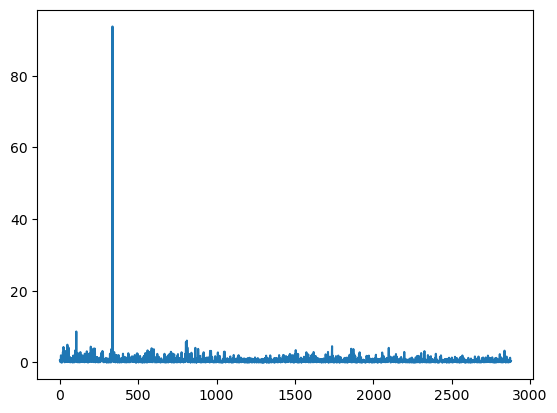

In [ ]:
plt.plot(bandpower)

In [ ]:
with db:
    df = db.get_table("Raw_Stimulus")
df.hvplot(x="timestamp", y="rating", kind="line", groupby="trial_id")

BokehModel(combine_events=True, render_bundle={'docs_json': {'c66a6002-fb68-4cd9-b7f1-6c021a7c395e': {'version…

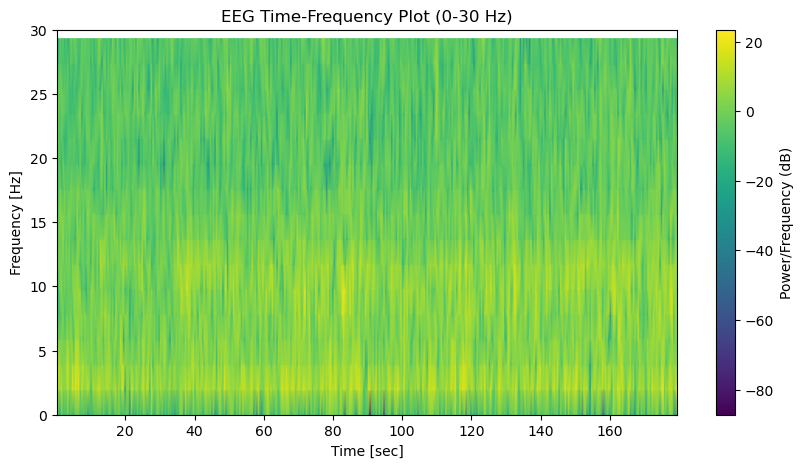

In [ ]:
sampling_rate = 500  # Replace with your EEG's sampling rate in Hz
low_freq = 0
high_freq = 30

from scipy.signal import spectrogram

# Computing the spectrogram
frequencies, times, spectrogram_data = spectrogram(eeg_ch, fs=sampling_rate)

# Limiting the spectrogram to the frequency range of interest
freq_indices = (frequencies >= low_freq) & (frequencies <= high_freq)
frequencies = frequencies[freq_indices]
spectrogram_data = spectrogram_data[freq_indices, :]

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.pcolormesh(times, frequencies, 10 * np.log10(spectrogram_data), shading="gouraud")
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")
plt.title("EEG Time-Frequency Plot (0-30 Hz)")
plt.colorbar(label="Power/Frequency (dB)")
plt.ylim(low_freq, high_freq)  # Set the y-axis to show only 0-30 Hz
plt.show()

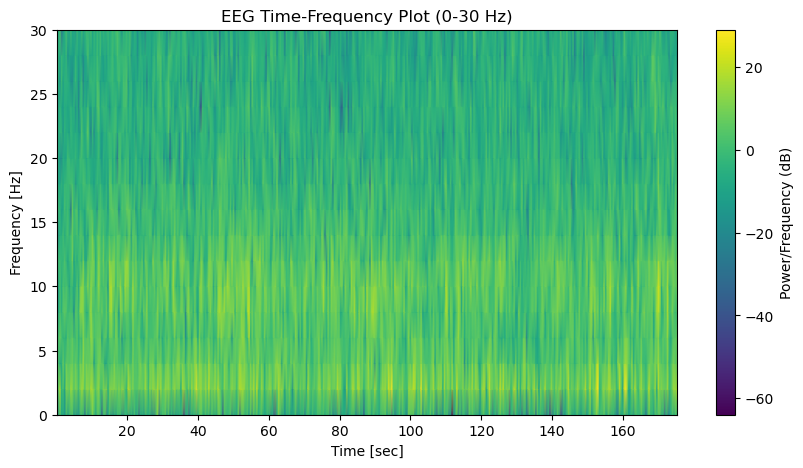

In [ ]:
sampling_rate = 500  # Replace with your EEG's sampling rate in Hz
low_freq = 0
high_freq = 30

from scipy.signal import spectrogram

# Computing the spectrogram
frequencies, times, spectrogram_data = spectrogram(eeg_ch, fs=sampling_rate)

# Limiting the spectrogram to the frequency range of interest
freq_indices = (frequencies >= low_freq) & (frequencies <= high_freq)
frequencies = frequencies[freq_indices]
spectrogram_data = spectrogram_data[freq_indices, :]

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.pcolormesh(times, frequencies, 10 * np.log10(spectrogram_data), shading="gouraud")
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")
plt.title("EEG Time-Frequency Plot (0-30 Hz)")
plt.colorbar(label="Power/Frequency (dB)")
plt.ylim(low_freq, high_freq)  # Set the y-axis to show only 0-30 Hz
plt.show()

<Axes: xlabel='Timestamp'>

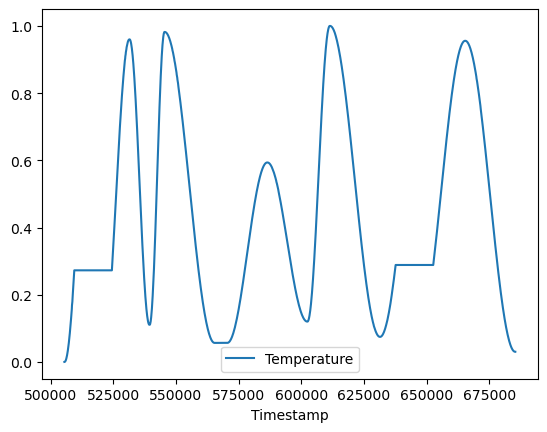

In [ ]:
dfs.stimulus.filter(pl.col("Trial") == 1).to_pandas().plot(
    x="Timestamp", y="Temperature"
)

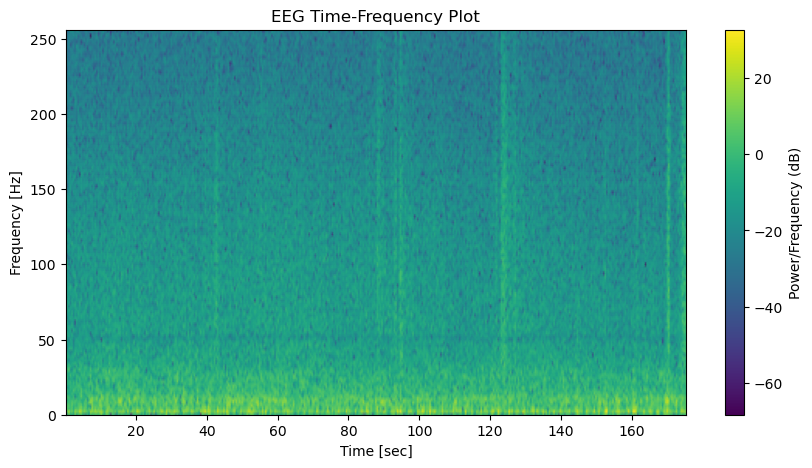

In [ ]:
from scipy.signal import spectrogram
import numpy as np

from scipy.signal import iirnotch, filtfilt

# Define the notch filter frequency and quality factor
notch_freq = 50  # Frequency to be removed from signal (Hz)
quality_factor = 30  # Quality factor

# Sampling rate
sampling_rate = 500  # Replace 256 with your actual EEG sampling rate in Hz

# Design notch filter
b, a = iirnotch(notch_freq, quality_factor, sampling_rate)

# Apply the filter
filtered_eeg = filtfilt(b, a, eeg_ch)


# Assuming the EEG data is in one channel
frequencies, times, spectrogram_data = spectrogram(filtered_eeg, fs=512)
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.pcolormesh(times, frequencies, 10 * np.log10(spectrogram_data), shading="gouraud")
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [sec]")
plt.title("EEG Time-Frequency Plot")
plt.colorbar(label="Power/Frequency (dB)")
plt.show()

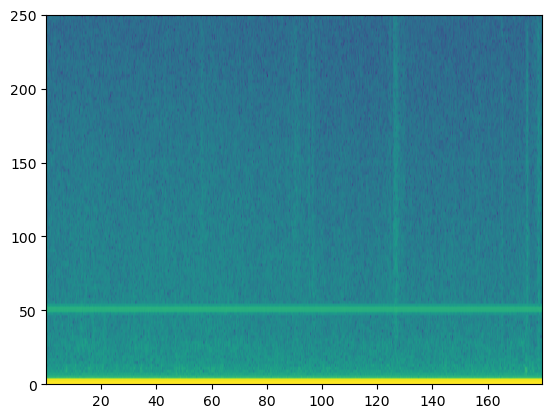

In [ ]:
_ = plt.specgram(eeg_ch, Fs=500)

## MNE

In [ ]:
sampling_rate = 500

# Convert to numpy array and transpose to get channels x timeseries
eeg_data = eeg.select(pl.col("^EEG_.*$")).to_numpy().T

# Create the info structure needed by MNE
ch_names = [
    "EEG 001",
    "EEG 002",
    "EEG 003",
    "EEG 004",
    "EEG 005",
    "EEG 006",
    "EEG 007",
    "EEG 008",
]
ch_types = ["eeg"] * 8
info = mne.create_info(ch_names=ch_names, sfreq=sampling_rate, ch_types=ch_types)
raw = mne.io.RawArray(eeg_data, info)
raw.filter(l_freq=1.0, h_freq=40.0)  # Band-pass filtering

raw

Creating RawArray with float64 data, n_channels=8, n_times=1080059
    Range : 0 ... 1080058 =      0.000 ...  2160.116 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (3.302 s)



Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,8 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,500.00 Hz
Highpass,1.00 Hz
Lowpass,40.00 Hz


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


/var/folders/54/0yy_ylvj7tx247wkq0n07dnr0000gn/T/ipykernel_16526/2174347421.py:1: FutureWarning:

The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.

/Users/visser/miniforge3/envs/pain/lib/python3.11/site-packages/mne/viz/utils.py:167: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



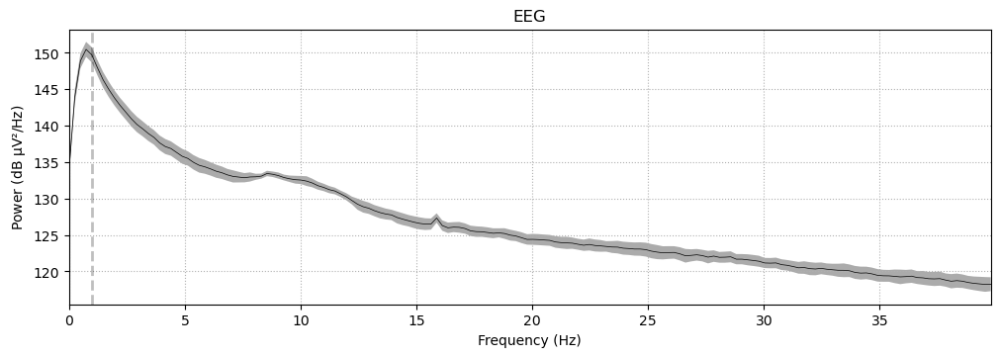

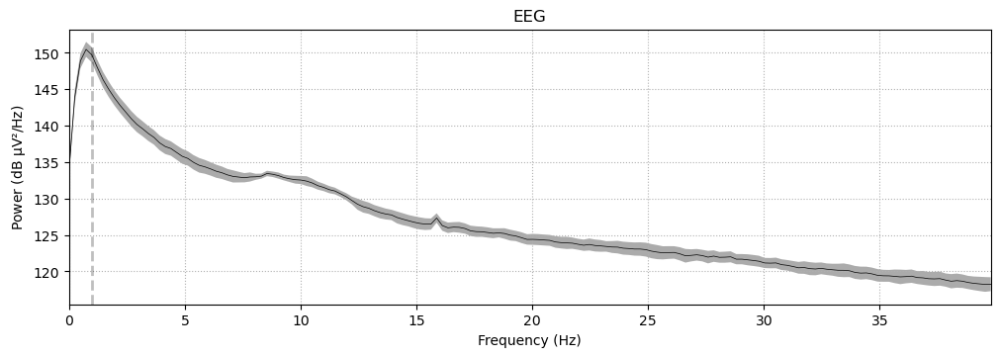

In [ ]:
raw.plot_psd(fmax=40, average=True)

In [ ]:
raw.filter(l_freq=1.0, h_freq=40.0)  # Band-pass filtering

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (3.302 s)



Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,8 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,500.00 Hz
Highpass,1.00 Hz
Lowpass,40.00 Hz


In [ ]:
events = mne.find_events(raw, stim_channel="STI 014")

# Construct Epochs
event_id, tmin, tmax = 1, -1.0, 3.0
baseline = (None, 0)
epochs = mne.Epochs(
    raw,
    events,
    event_id,
    tmin,
    tmax,
    picks=picks,
    baseline=baseline,
    reject=dict(grad=4000e-13, eog=350e-6),
    preload=True,
)

ValueError: Missing channels from ch_names required by include:
['STI 014']

In [ ]:
# Define a dictionary mapping old channel names to new ones
new_channel_names = {
    "EEG 001": "F3",
    "EEG 002": "F4",
    "EEG 003": "C3",
    "EEG 004": "Cz",
    "EEG 005": "C4",
    "EEG 006": "P3",
    "EEG 007": "P4",
    "EEG 008": "Oz",
}

# Rename channels
raw.rename_channels(new_channel_names)

# Optionally, set the type of channels if not already set
channel_types = {name: "eeg" for name in new_channel_names.values()}
raw.set_channel_types(channel_types)

# Check the new configuration
raw.info

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,8 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,500.00 Hz
Highpass,0.00 Hz
Lowpass,250.00 Hz


In [ ]:
raw.filter(l_freq=1.0, h_freq=40.0)  # Band-pass filtering
raw.notch_filter(freqs=50)  # Notch filter at 50 Hz

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (3.302 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edg

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,8 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,500.00 Hz
Highpass,1.00 Hz
Lowpass,40.00 Hz


In [ ]:
start_stop_seconds = np.array([30, 210])  # Example: analyzing data from 30s to 210s
start_sample, stop_sample = (start_stop_seconds * raw.info["sfreq"]).astype(int)
raw_segment = raw.copy().crop(
    tmin=start_sample / raw.info["sfreq"], tmax=stop_sample / raw.info["sfreq"]
)

In [ ]:
frequencies = np.arange(1, 40, 1)  # Define frequency range
n_cycles = frequencies / 2.0  # Different number of cycle per frequency
power = mne.time_frequency.tfr_morlet(
    raw_segment,
    freqs=frequencies,
    n_cycles=n_cycles,
    use_fft=True,
    return_itc=False,
    decim=3,
    n_jobs=1,
)

NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").
inst is Evoked, setting `average=False`


In [ ]:
power = raw_segment.compute_tfr(
    method="morlet",
    freqs=frequencies,
    n_cycles=n_cycles,
    use_fft=True,
    return_itc=False,
    decim=3,
    n_jobs=1,
)

TypeError: Got unexpected keyword argument return_itc for TFR method "morlet".

No baseline correction applied


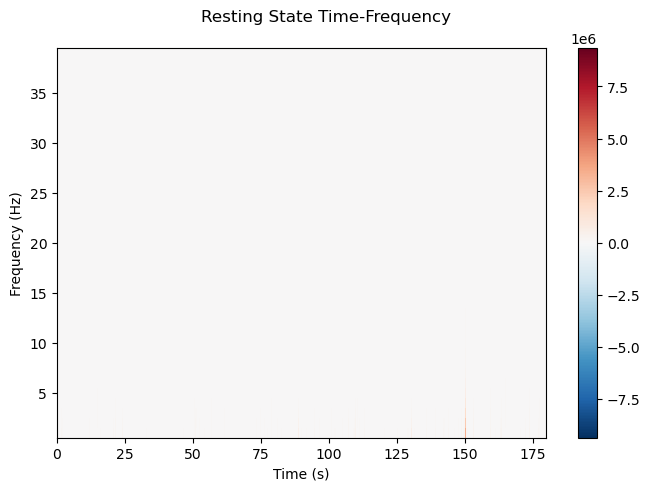

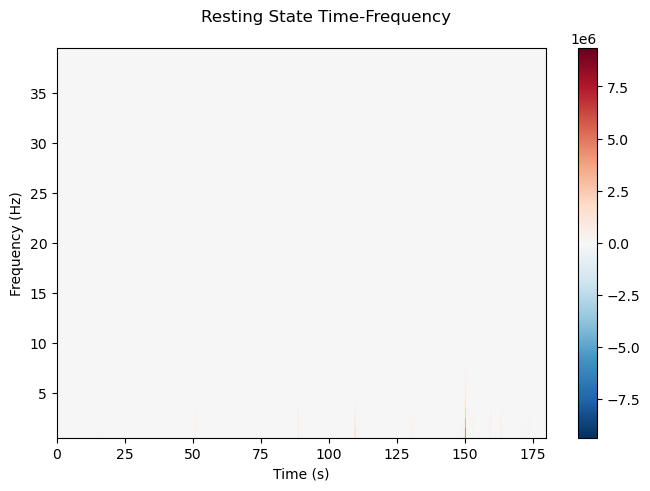

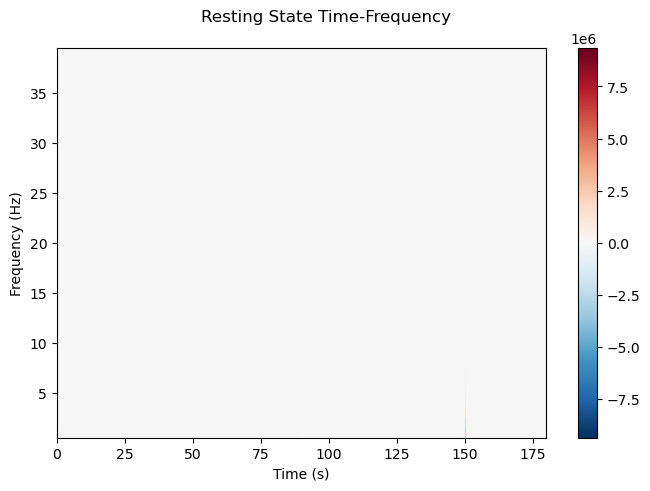

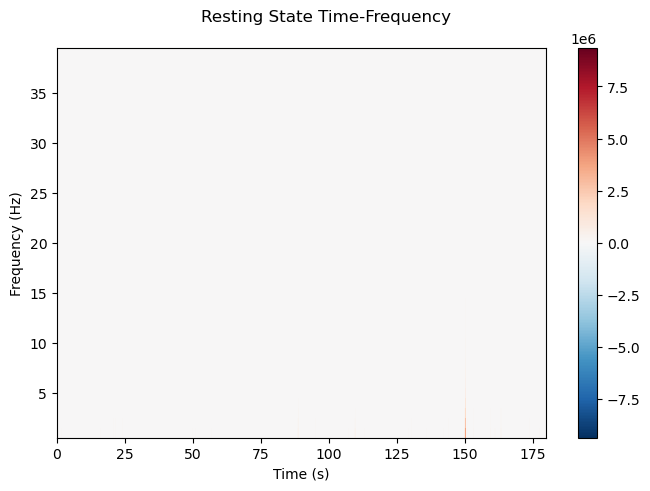

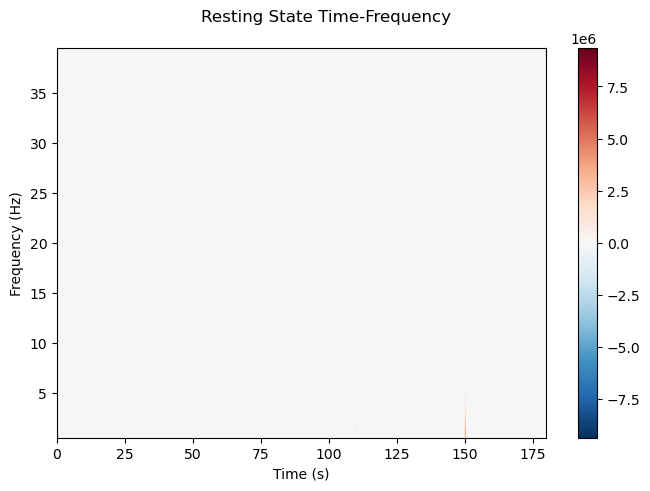

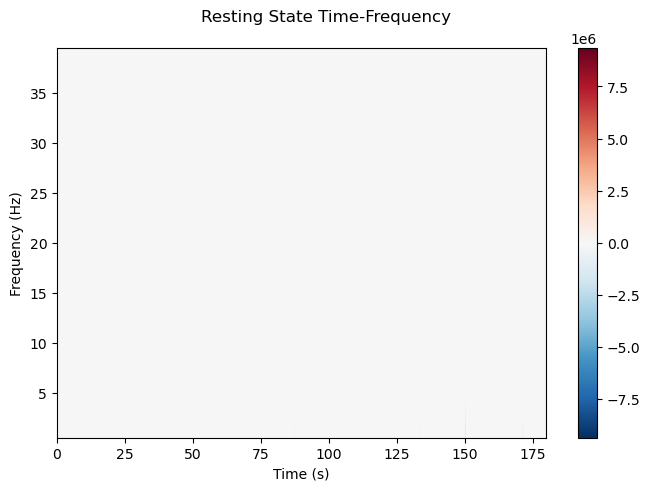

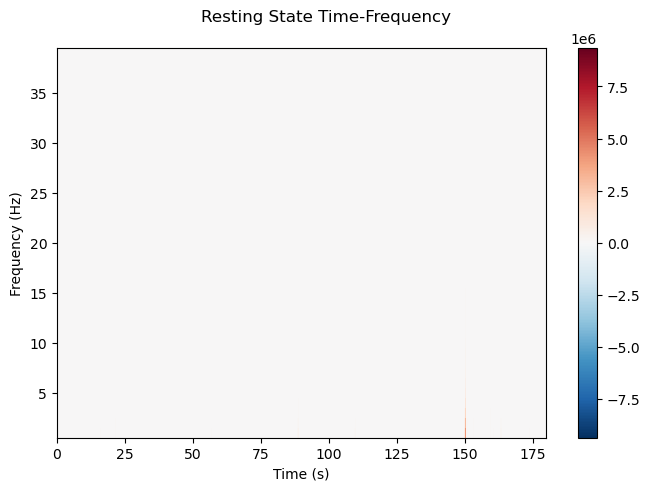

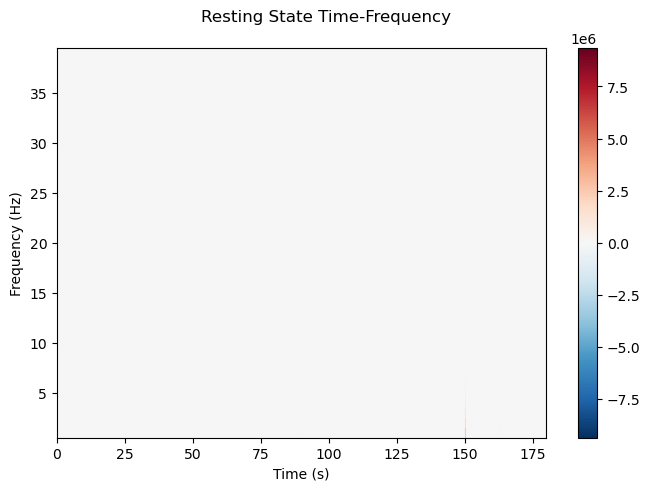

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [ ]:
power.plot(picks="eeg", mode="logratio", title="Resting State Time-Frequency")

In [ ]:
import numpy as np

frequencies = np.arange(1, 40, 1)  # Define frequency range
n_cycles = frequencies / 2.0  # Different number of cycle per frequency
power = mne.time_frequency.tfr_morlet(
    epochs,
    freqs=frequencies,
    n_cycles=n_cycles,
    use_fft=True,
    return_itc=False,
    decim=3,
    n_jobs=1,
)

NameError: name 'epochs' is not defined

In [ ]:
mne.time_frequency.compute_tfr(method=”morlet”)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 825 samples (1.650 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


/var/folders/54/0yy_ylvj7tx247wkq0n07dnr0000gn/T/ipykernel_4132/1613471090.py:6: FutureWarning:

The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.

/var/folders/54/0yy_ylvj7tx247wkq0n07dnr0000gn/T/ipykernel_4132/1613471090.py:6: RuntimeWarning:

Channel locations not available. Disabling spatial colors.

/Users/visser/miniforge3/envs/pain/lib/python3.11/site-packages/mne/viz/utils.py:167: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



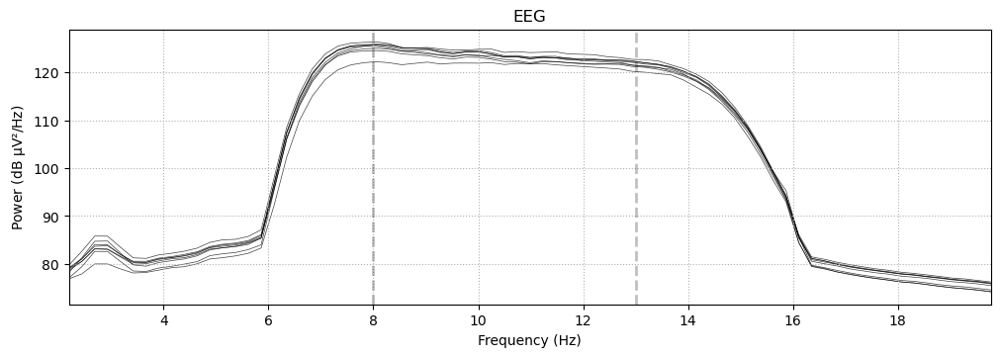

In [ ]:
# Apply filter for the Alpha band (8-13 Hz)
raw = eeg_mne.copy()
raw_alpha = raw.copy().filter(l_freq=8, h_freq=13)

# Plot the data to see the effect of the filter
raw_alpha.plot_psd(fmin=2, fmax=20)  # Plotting power spectral density

## Questions



In [ ]:
# - Artifacture removal for 8-channels? ICA not possible?
# - Power analysis? Which method? Window size? Only alpha? Or all bands?

## Plot

In [ ]:
merged = merge_datasets(eeg_raw, heat)
merged = scale_min_max(merged)
merged = interpolate(merged)  # BUG
merged

NameError: name 'eeg_raw' is not defined

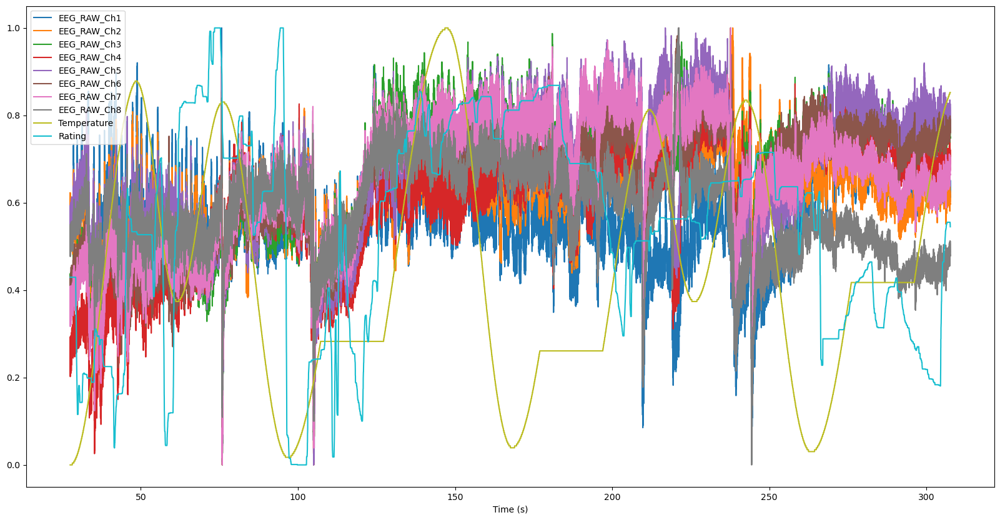

In [ ]:
plot_trial_matplotlib(merged, trial=0)

In [ ]:
plot_data_panel(merged)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

15:36:14 | WARNING | param.main | backend option not found for line plot with plotly; similar options include: []


INFO:bokeh.server.server:Starting Bokeh server version 3.3.3 (running on Tornado 6.3.3)
INFO:bokeh.server.tornado:User authentication hooks NOT provided (default user enabled)
DEBUG:bokeh.server.tornado:These host origins can connect to the websocket: ['localhost:56626']
DEBUG:bokeh.server.tornado:Patterns are:
DEBUG:bokeh.server.tornado:  [('/favicon.ico',
DEBUG:bokeh.server.tornado:    <class 'bokeh.server.views.ico_handler.IcoHandler'>,
DEBUG:bokeh.server.tornado:    {'app': <bokeh.server.tornado.BokehTornado object at 0x14360ea50>}),
DEBUG:bokeh.server.tornado:   ('/?',
DEBUG:bokeh.server.tornado:    <class 'panel.io.server.DocHandler'>,
DEBUG:bokeh.server.tornado:    {'application_context': <bokeh.server.contexts.ApplicationContext object at 0x14b8e5fd0>,
DEBUG:bokeh.server.tornado:     'bokeh_websocket_path': '/ws'}),
DEBUG:bokeh.server.tornado:   ('/ws',
DEBUG:bokeh.server.tornado:    <class 'bokeh.server.views.ws.WSHandler'>,
DEBUG:bokeh.server.tornado:    {'application_context

Launching server at http://localhost:56626


INFO:tornado.access:200 GET / (127.0.0.1) 315.98ms
INFO:tornado.access:200 GET /static/extensions/panel/bundled/jquery/jquery.slim.min.js (127.0.0.1) 4.44ms
INFO:tornado.access:200 GET /static/js/bokeh-gl.min.js?v=bf37f0b457d54fefb6ca8423c37db6ae69479153907d223a22f57d090b957998e75abda056bf5b0916a24f99930fa6df3b242a1a3a0986b549fbc966c1e04416 (127.0.0.1) 12.10ms
INFO:tornado.access:200 GET /static/js/bokeh-widgets.min.js?v=3c2dbaf226dc96c10bf3dfbcde30557363d2c16ec86bf2a10fb615e53d3971cbcf801e5051aa500292ec49f54812deae2aec9aaad0d97331534c89fe18ede89a (127.0.0.1) 12.37ms
INFO:tornado.access:200 GET /static/js/bokeh-tables.min.js?v=7849f2320ea741465a49857765873105e961ae71f15b481c5c529e76627d3706d004fe429b0472d4ba9e19fac7cf9be1874ba144e996beb84d89fe89958293f4 (127.0.0.1) 12.56ms
INFO:tornado.access:200 GET /static/extensions/panel/panel.min.js?v=0faff9f97292449eee32b81df88f812bca038d443c5a2254802df6108463f0fe (127.0.0.1) 15.85ms
INFO:tornado.access:200 GET /static/js/bokeh.min.js?v=f43c49e86

In [ ]:
import wonambi as wn

# generate data
data = wn.create_data(n_chan=2, signal="sine", amplitude=1)

traces = [go.Scatter(x=data.time[0], y=data(trial=0, chan="chan00"))]
layout = go.Layout(xaxis=dict(title="Time (s)"), yaxis=dict(title="Amplitude (V)"))

17:40:15 | DEBUG   | h5py._conv | Creating converter from 7 to 5
17:40:15 | DEBUG   | h5py._conv | Creating converter from 5 to 7
17:40:15 | DEBUG   | h5py._conv | Creating converter from 7 to 5
17:40:15 | DEBUG   | h5py._conv | Creating converter from 5 to 7


AttributeError: module 'wonambi' has no attribute 'create_data'

INFO:tornado.access:200 GET / (127.0.0.1) 296.61ms
INFO:tornado.access:200 GET /static/extensions/panel/bundled/jquery/jquery.slim.min.js (127.0.0.1) 1.07ms
INFO:tornado.access:200 GET /static/js/bokeh.min.js?v=f43c49e86dc38c1a13b9f41aad15fb57c3b2f70844817e5559b32d9e0a177c319416281f7bac18181198884ceb3998420b37b2b0199e0d0dc6485e34fc0a28dc (127.0.0.1) 5.41ms
INFO:tornado.access:200 GET /static/extensions/panel/bundled/plotlyplot/plotly-2.18.0.min.js (127.0.0.1) 66.91ms
INFO:tornado.access:200 GET /static/js/bokeh-gl.min.js?v=bf37f0b457d54fefb6ca8423c37db6ae69479153907d223a22f57d090b957998e75abda056bf5b0916a24f99930fa6df3b242a1a3a0986b549fbc966c1e04416 (127.0.0.1) 0.64ms
INFO:tornado.access:200 GET /static/js/bokeh-widgets.min.js?v=3c2dbaf226dc96c10bf3dfbcde30557363d2c16ec86bf2a10fb615e53d3971cbcf801e5051aa500292ec49f54812deae2aec9aaad0d97331534c89fe18ede89a (127.0.0.1) 1.24ms
INFO:tornado.access:200 GET /static/js/bokeh-tables.min.js?v=7849f2320ea741465a49857765873105e961ae71f15b481c5c52